# train

In [1]:
import yaml
import os

with open("./config.yaml", 'rb') as f:
    config = yaml.load(f)

<ipython-input-1-1499ab5789c7>:5: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  config = yaml.load(f)


In [2]:
OUTPUT_ROOT = config['IO_OPTION']['OUTPUT_ROOT']
os.makedirs(OUTPUT_ROOT, exist_ok=True)

## load library

In [3]:
# python default library
import os
import shutil
import datetime
import sys
import pickle
import random
from random import sample

# general analysis tool-kit
import numpy as np
import pandas as pd
#from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns

# pytorch
import torch
from torch import optim, nn
from torch.utils.tensorboard import SummaryWriter

#from torchsummary import summary

# etc
import yaml
yaml.warnings({'YAMLLoadWarning': False})

# original library
sys.path.append('/home/hiroki/research/dcase2021_task2/src/functions')
import common as com
import pytorch_modeler as modeler
from pytorch_model import Conditional_VAE as Model
#from pytorch_utils import filtered_load_model
#import models

import librosa
import IPython
import librosa.display

## load config and set logger

In [4]:
log_file = config['IO_OPTION']['OUTPUT_ROOT']+'/train_{0}.log'.format(datetime.date.today())
logger = com.setup_logger(log_file, '00_train.py')

## Setting

In [5]:
# Setting seed
modeler.set_seed(777)

In [6]:
############################################################################
# Setting I/O path
############################################################################
# input dirs
INPUT_ROOT = config['IO_OPTION']['INPUT_ROOT']
#dev_dir = INPUT_ROOT + "/dev_data"
#add_dev_dir = INPUT_ROOT + "/add_dev_data"
# machine type
machine_types = ['ToyCar', 'gearbox', 'valve', 'ToyTrain', 'pump', 'fan', 'slider']
# output dirs
OUTPUT_ROOT = config['IO_OPTION']['OUTPUT_ROOT']
MODEL_DIR = config['IO_OPTION']['OUTPUT_ROOT'] + '/models'
TB_DIR = config['IO_OPTION']['OUTPUT_ROOT'] + '/tb'
OUT_FEATURE_DIR = OUTPUT_ROOT + '/extraction_features'
OUT_SCORE_DIR = OUTPUT_ROOT + '/score'
OUT_PRED_DIR = OUTPUT_ROOT + '/pred'
#os.makedirs(OUTPUT_ROOT, exist_ok=True)
os.makedirs(MODEL_DIR, exist_ok=True)
os.makedirs(TB_DIR, exist_ok=True)
os.makedirs(OUT_FEATURE_DIR, exist_ok=True)
os.makedirs(OUT_SCORE_DIR, exist_ok=True)
os.makedirs(OUT_PRED_DIR, exist_ok=True)
# copy config
shutil.copy('./config.yaml', OUTPUT_ROOT)

'/media/hiroki/HDD1TB/research/dcase2021_task2/output/CenterLossVAE/ex19/config.yaml'

In [7]:
torch.cuda.is_available()

True

In [8]:
ext_data = pd.read_pickle(f'{INPUT_ROOT}/valve_features.pkl')

In [9]:
#train_features = ext_data['train']['features']

In [10]:
#train_features.shape

## training

In [11]:
def random_feature_selection(x, t_d=3776, d=2048):
    idx = torch.tensor(sample(range(0, t_d), d)) # t_d(特徴量)の中からランダムにd個サンプリングする(ぜんぶやると重いから) # わからん
    # 0~t_d idxの中からランダムにd個サンプリングする
    x = np.take(x, idx, 1)
    return x

In [12]:
#ext_data['train'].keys()

In [13]:
#############################################################################
# run
#############################################################################
def run(machine_type):
    com.tic()
    logger.info('TARGET MACHINE_TYPE: {0}'.format(machine_type))
    logger.info('MAKE DATA_LOADER')
    # dataloader
    #for machine in machine_types:
    #    if machine_type == machine:
    #        ext_data = pd.read_pickle(f'{INPUT_ROOT}/{machine}_features.pkl')
    #    else:
    #        ext_data_ = pd.read_pickle(f'{INPUT_ROOT}/{machine}_features.pkl')
    #        ext_data['train']['features'] = np.concatenate([ext_data['train']['features'],
    #                                                        ext_data_['train']['features']], axis=0)
    #        ext_data['train']['labels'] = np.concatenate([ext_data['train']['labels'],
    #                                                     ext_data_['train']['labels']], axis=0)
    #        ext_data['train']['wav_names'] = np.concatenate([ext_data['train']['wav_names'],
    #                                                         ext_data_['train']['wav_names']], axis=0)
            
    #t_d = 3776    # 全特徴量数
    #d = 1024      # 使う特徴量数
    #for phase in ['train', 'valid_source', 'valid_target']:
    #    x = ext_data[phase]['features']
    #    x = random_feature_selection(x)
    #    ext_data[phase]['features'] = x
    #    x = ext_data[phase]['features'][:,512:2048]
    #    ext_data[phase]['features'] = x
    dataloaders_dict = modeler.make_dataloader(ext_data)
    # define writer for tensorbord
    os.makedirs(TB_DIR+'/'+machine_type, exist_ok=True)
    tb_log_dir = TB_DIR + '/' + machine_type
    writer = SummaryWriter(log_dir = tb_log_dir)
    # out path
    model_out_path = MODEL_DIR+'/{}_model.pth'.format(machine_type)
    score_out_path = OUT_SCORE_DIR + '/{}_score.csv'.format(machine_type)
    pred_out_path = OUT_PRED_DIR + '/{}_pred.csv'.format(machine_type)
    logger.info('TRAINING')
    # parameter setting
    in_features = ext_data['train']['features'].shape[1]
    mid_size = config['param']['mid_size']
    latent_size = config['param']['latent_size']
    num_classes = 6
    net = Model(in_features, mid_size, latent_size, num_classes)
    optimizer = optim.Adam(net.parameters(), lr=1e-4)
    num_epochs = config['param']['num_epochs']
    #scheduler = optim.lr_scheduler.OneCycleLR(optimizer=optimizer, pct_start=0.1, div_factor=1e-2, 
    #                                          max_lr=1e-3, epochs=num_epochs, steps_per_epoch=len(dataloaders_dict['train']))
    # training
    output_dicts = modeler.train_net(net, dataloaders_dict, optimizer, num_epochs, writer, model_out_path, score_out_path, pred_out_path)
    
    com.toc()

In [14]:
machine_types

['ToyCar', 'gearbox', 'valve', 'ToyTrain', 'pump', 'fan', 'slider']

2021-05-31 23:24:11,051 - 00_train.py - INFO - TARGET MACHINE_TYPE: ToyCar
2021-05-31 23:24:11,066 - 00_train.py - INFO - MAKE DATA_LOADER
2021-05-31 23:24:13,533 - 00_train.py - INFO - TRAINING
2021-05-31 23:24:19,121 - pytorch_modeler.py - INFO - train
  0%|          | 0/12 [00:00<?, ?it/s]

use: cuda:0


100%|██████████| 12/12 [00:01<00:00,  6.37it/s]
2021-05-31 23:24:21,007 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 78.23it/s]
2021-05-31 23:24:21,054 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 70.46it/s]


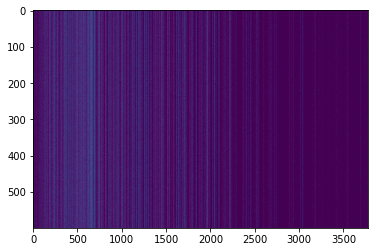

,AUC,pAUC
Source_0,0.530100,0.533684
Source_1,0.530150,0.531053
Source_2,0.605300,0.545263
Target_0,0.485700,0.553158
Target_1,0.647700,0.596316
Target_2,0.519700,0.488947
mean,0.553108,0.541404
h_mean,0.547857,0.539531


2021-05-31 23:24:23,554 - pytorch_modeler.py - INFO - epoch:1/100, train_losses:2563.376180, val_AUC_hmean:0.547857, val_pAUC_hmean:0.539531, best_flag:True
2021-05-31 23:24:23,555 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 14.38it/s]
2021-05-31 23:24:24,392 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 74.71it/s]
2021-05-31 23:24:24,440 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 74.47it/s]


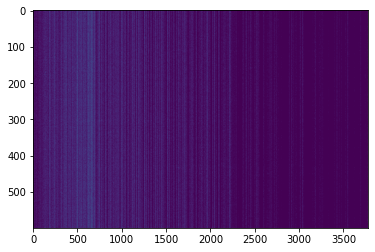

,AUC,pAUC
Source_0,0.553600,0.546842
Source_1,0.550800,0.531579
Source_2,0.680000,0.540000
Target_0,0.524900,0.583684
Target_1,0.658700,0.569474
Target_2,0.634100,0.505789
mean,0.600350,0.546228
h_mean,0.594484,0.545054


2021-05-31 23:24:26,870 - pytorch_modeler.py - INFO - epoch:2/100, train_losses:1600.014608, val_AUC_hmean:0.594484, val_pAUC_hmean:0.545054, best_flag:True
2021-05-31 23:24:26,871 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 15.68it/s]
2021-05-31 23:24:27,638 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 76.05it/s]
2021-05-31 23:24:27,684 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 75.65it/s]


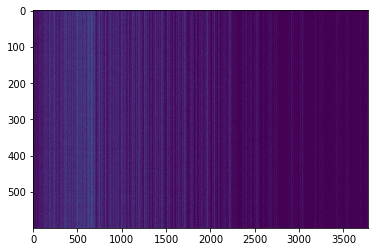

,AUC,pAUC
Source_0,0.555200,0.554211
Source_1,0.600800,0.548947
Source_2,0.669500,0.577368
Target_0,0.527400,0.591579
Target_1,0.668700,0.567895
Target_2,0.647800,0.516842
mean,0.611567,0.559474
h_mean,0.606399,0.558444


2021-05-31 23:24:29,986 - pytorch_modeler.py - INFO - epoch:3/100, train_losses:1242.611043, val_AUC_hmean:0.606399, val_pAUC_hmean:0.558444, best_flag:True
2021-05-31 23:24:29,987 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00, 11.61it/s]
2021-05-31 23:24:31,023 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 13.04it/s]
2021-05-31 23:24:31,197 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 43.88it/s]


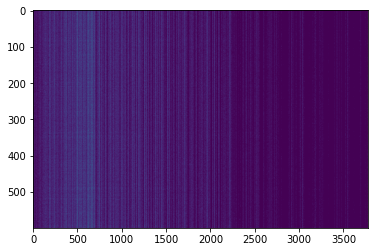

,AUC,pAUC
Source_0,0.559200,0.557895
Source_1,0.632900,0.560000
Source_2,0.715300,0.591053
Target_0,0.536500,0.601053
Target_1,0.676300,0.571053
Target_2,0.667200,0.515789
mean,0.631233,0.566140
h_mean,0.624500,0.564773


2021-05-31 23:24:33,734 - pytorch_modeler.py - INFO - epoch:4/100, train_losses:1093.359294, val_AUC_hmean:0.624500, val_pAUC_hmean:0.564773, best_flag:True
2021-05-31 23:24:33,736 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.67it/s]
2021-05-31 23:24:34,685 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 71.17it/s]
2021-05-31 23:24:34,738 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 78.22it/s]
2021-05-31 23:24:34,791 - pytorch_modeler.py - INFO - epoch:5/100, train_losses:1022.658457, val_AUC_hmean:0.629524, val_pAUC_hmean:0.561698, best_flag:False
2021-05-31 23:24:34,793 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 15.17it/s]
2021-05-31 23:24:35,586 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 75.52it/s]
2021-05-31 23:24:35,635 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 66.40it/s]


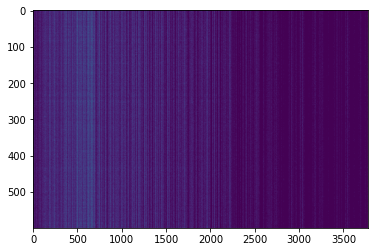

,AUC,pAUC
Source_0,0.569100,0.581579
Source_1,0.650400,0.541579
Source_2,0.794800,0.603158
Target_0,0.530000,0.614211
Target_1,0.680700,0.585789
Target_2,0.696600,0.520526
mean,0.653600,0.574474
h_mean,0.642105,0.572509


2021-05-31 23:24:37,823 - pytorch_modeler.py - INFO - epoch:6/100, train_losses:977.766683, val_AUC_hmean:0.642105, val_pAUC_hmean:0.572509, best_flag:True
2021-05-31 23:24:37,824 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 14.82it/s]
2021-05-31 23:24:38,636 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 61.13it/s]
2021-05-31 23:24:38,694 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 71.53it/s]
2021-05-31 23:24:38,755 - pytorch_modeler.py - INFO - epoch:7/100, train_losses:945.664541, val_AUC_hmean:0.632509, val_pAUC_hmean:0.571862, best_flag:False
2021-05-31 23:24:38,756 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 15.35it/s]
2021-05-31 23:24:39,540 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 39.49it/s]
2021-05-31 23:24:39,611 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 44.97it/s]


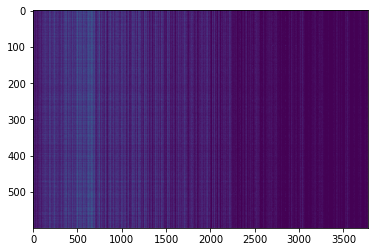

,AUC,pAUC
Source_0,0.599100,0.597895
Source_1,0.656200,0.570526
Source_2,0.821700,0.707895
Target_0,0.546400,0.625789
Target_1,0.684600,0.581053
Target_2,0.653600,0.511579
mean,0.660267,0.599123
h_mean,0.649988,0.593374


2021-05-31 23:24:42,194 - pytorch_modeler.py - INFO - epoch:8/100, train_losses:928.681580, val_AUC_hmean:0.649988, val_pAUC_hmean:0.593374, best_flag:True
2021-05-31 23:24:42,204 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  9.76it/s]
2021-05-31 23:24:43,436 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 39.12it/s]
2021-05-31 23:24:43,511 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 45.84it/s]


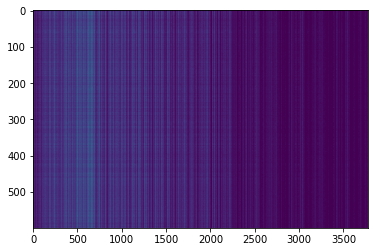

,AUC,pAUC
Source_0,0.595300,0.605789
Source_1,0.695600,0.594211
Source_2,0.802300,0.713684
Target_0,0.557400,0.643684
Target_1,0.706900,0.595263
Target_2,0.655000,0.511053
mean,0.668750,0.610614
h_mean,0.659396,0.604531


2021-05-31 23:24:45,954 - pytorch_modeler.py - INFO - epoch:9/100, train_losses:908.282608, val_AUC_hmean:0.659396, val_pAUC_hmean:0.604531, best_flag:True
2021-05-31 23:24:45,956 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 13.96it/s]
2021-05-31 23:24:46,818 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 43.83it/s]
2021-05-31 23:24:46,885 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 57.08it/s]
2021-05-31 23:24:46,950 - pytorch_modeler.py - INFO - epoch:10/100, train_losses:892.862228, val_AUC_hmean:0.649226, val_pAUC_hmean:0.592134, best_flag:False
2021-05-31 23:24:46,951 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  9.21it/s]
2021-05-31 23:24:48,256 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 45.07it/s]
2021-05-31 23:24:48,323 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 46.13it/s]


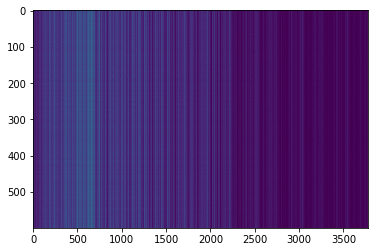

,AUC,pAUC
Source_0,0.618700,0.610000
Source_1,0.728500,0.618947
Source_2,0.809600,0.687895
Target_0,0.579650,0.643684
Target_1,0.731600,0.601053
Target_2,0.650500,0.513684
mean,0.686425,0.612544
h_mean,0.677700,0.607735


2021-05-31 23:24:50,625 - pytorch_modeler.py - INFO - epoch:11/100, train_losses:877.311234, val_AUC_hmean:0.677700, val_pAUC_hmean:0.607735, best_flag:True
2021-05-31 23:24:50,626 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.32it/s]
2021-05-31 23:24:51,603 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 71.66it/s]
2021-05-31 23:24:51,654 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 75.78it/s]
2021-05-31 23:24:51,709 - pytorch_modeler.py - INFO - epoch:12/100, train_losses:868.195206, val_AUC_hmean:0.678745, val_pAUC_hmean:0.601313, best_flag:False
2021-05-31 23:24:51,710 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 14.78it/s]
2021-05-31 23:24:52,524 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 64.73it/s]
2021-05-31 23:24:52,577 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 81.00it/s]
2021-05-31 23:24:

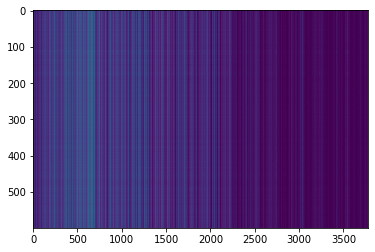

,AUC,pAUC
Source_0,0.649200,0.624737
Source_1,0.712400,0.605789
Source_2,0.820000,0.711579
Target_0,0.596400,0.648421
Target_1,0.731400,0.604737
Target_2,0.666100,0.517895
mean,0.695917,0.618860
h_mean,0.688957,0.613280


2021-05-31 23:24:59,097 - pytorch_modeler.py - INFO - epoch:16/100, train_losses:827.696213, val_AUC_hmean:0.688957, val_pAUC_hmean:0.613280, best_flag:True
2021-05-31 23:24:59,098 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 14.68it/s]
2021-05-31 23:24:59,918 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 72.33it/s]
2021-05-31 23:24:59,969 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 76.10it/s]
2021-05-31 23:25:00,023 - pytorch_modeler.py - INFO - epoch:17/100, train_losses:817.483810, val_AUC_hmean:0.690872, val_pAUC_hmean:0.609216, best_flag:False
2021-05-31 23:25:00,024 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 14.78it/s]
2021-05-31 23:25:00,838 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 49.93it/s]
2021-05-31 23:25:00,902 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 51.90it/s]
2021-05-31 23:25:

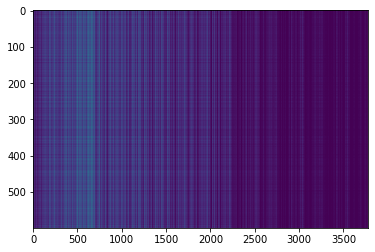

,AUC,pAUC
Source_0,0.661700,0.632632
Source_1,0.741500,0.620000
Source_2,0.806200,0.716842
Target_0,0.603900,0.652632
Target_1,0.759000,0.620000
Target_2,0.685400,0.528947
mean,0.709617,0.628509
h_mean,0.703178,0.623421


2021-05-31 23:25:06,504 - pytorch_modeler.py - INFO - epoch:21/100, train_losses:788.057744, val_AUC_hmean:0.703178, val_pAUC_hmean:0.623421, best_flag:True
2021-05-31 23:25:06,506 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  9.05it/s]
2021-05-31 23:25:07,834 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 37.73it/s]
2021-05-31 23:25:07,910 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 38.42it/s]
2021-05-31 23:25:07,987 - pytorch_modeler.py - INFO - epoch:22/100, train_losses:781.899200, val_AUC_hmean:0.693630, val_pAUC_hmean:0.621630, best_flag:False
2021-05-31 23:25:07,988 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  9.35it/s]
2021-05-31 23:25:09,274 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 57.80it/s]
2021-05-31 23:25:09,330 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 39.11it/s]
2021-05-31 23:25:

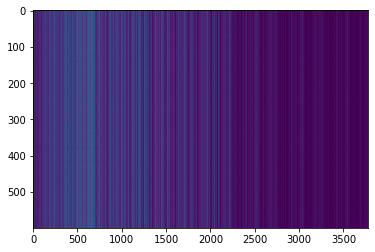

,AUC,pAUC
Source_0,0.666600,0.621579
Source_1,0.741400,0.634737
Source_2,0.817300,0.709474
Target_0,0.609300,0.646316
Target_1,0.755600,0.628421
Target_2,0.696600,0.535263
mean,0.714467,0.629298
h_mean,0.708156,0.624966


2021-05-31 23:25:16,409 - pytorch_modeler.py - INFO - epoch:26/100, train_losses:757.250473, val_AUC_hmean:0.708156, val_pAUC_hmean:0.624966, best_flag:True
2021-05-31 23:25:16,410 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  9.33it/s]
2021-05-31 23:25:17,698 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 53.97it/s]
2021-05-31 23:25:17,765 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 62.81it/s]
2021-05-31 23:25:17,831 - pytorch_modeler.py - INFO - epoch:27/100, train_losses:749.714350, val_AUC_hmean:0.704049, val_pAUC_hmean:0.619333, best_flag:False
2021-05-31 23:25:17,832 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  9.35it/s]
2021-05-31 23:25:19,117 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 60.21it/s]
2021-05-31 23:25:19,169 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 56.96it/s]


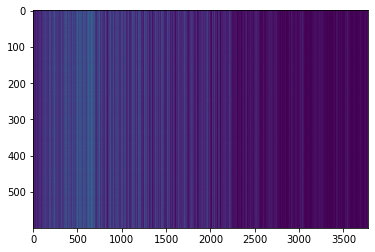

,AUC,pAUC
Source_0,0.667800,0.622632
Source_1,0.734000,0.627895
Source_2,0.819900,0.733684
Target_0,0.603200,0.637895
Target_1,0.764400,0.632105
Target_2,0.682400,0.533684
mean,0.711950,0.631316
h_mean,0.704973,0.625969


2021-05-31 23:25:21,277 - pytorch_modeler.py - INFO - epoch:28/100, train_losses:744.402150, val_AUC_hmean:0.704973, val_pAUC_hmean:0.625969, best_flag:True
2021-05-31 23:25:21,278 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  9.40it/s]
2021-05-31 23:25:22,557 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 49.53it/s]
2021-05-31 23:25:22,617 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 47.83it/s]
2021-05-31 23:25:22,682 - pytorch_modeler.py - INFO - epoch:29/100, train_losses:737.856171, val_AUC_hmean:0.698263, val_pAUC_hmean:0.612554, best_flag:False
2021-05-31 23:25:22,683 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  9.35it/s]
2021-05-31 23:25:23,968 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 58.96it/s]
2021-05-31 23:25:24,022 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 52.64it/s]
2021-05-31 23:25:

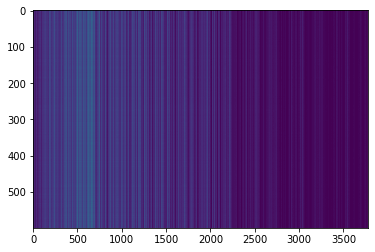

,AUC,pAUC
Source_0,0.687100,0.631579
Source_1,0.745300,0.631053
Source_2,0.814500,0.708947
Target_0,0.619900,0.649474
Target_1,0.766800,0.639474
Target_2,0.676500,0.526316
mean,0.718350,0.631140
h_mean,0.712558,0.626173


2021-05-31 23:25:27,429 - pytorch_modeler.py - INFO - epoch:31/100, train_losses:726.872091, val_AUC_hmean:0.712558, val_pAUC_hmean:0.626173, best_flag:True
2021-05-31 23:25:27,430 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  9.49it/s]
2021-05-31 23:25:28,697 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 42.84it/s]
2021-05-31 23:25:28,764 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 56.75it/s]
2021-05-31 23:25:28,821 - pytorch_modeler.py - INFO - epoch:32/100, train_losses:720.797821, val_AUC_hmean:0.713629, val_pAUC_hmean:0.622705, best_flag:False
2021-05-31 23:25:28,822 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  9.92it/s]
2021-05-31 23:25:30,033 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 38.91it/s]
2021-05-31 23:25:30,105 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 42.42it/s]
2021-05-31 23:25:

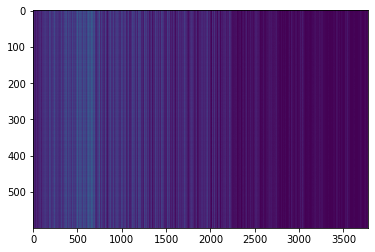

,AUC,pAUC
Source_0,0.663900,0.626842
Source_1,0.756300,0.642632
Source_2,0.822500,0.714211
Target_0,0.599900,0.641053
Target_1,0.789800,0.647368
Target_2,0.687900,0.522632
mean,0.720050,0.632456
h_mean,0.711653,0.626986


2021-05-31 23:25:33,581 - pytorch_modeler.py - INFO - epoch:34/100, train_losses:712.431575, val_AUC_hmean:0.711653, val_pAUC_hmean:0.626986, best_flag:True
2021-05-31 23:25:33,582 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  9.34it/s]
2021-05-31 23:25:34,869 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 43.39it/s]
2021-05-31 23:25:34,932 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 36.92it/s]
2021-05-31 23:25:35,009 - pytorch_modeler.py - INFO - epoch:35/100, train_losses:707.862645, val_AUC_hmean:0.706829, val_pAUC_hmean:0.622938, best_flag:False
2021-05-31 23:25:35,010 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  9.44it/s]
2021-05-31 23:25:36,283 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 47.91it/s]
2021-05-31 23:25:36,343 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 61.47it/s]
2021-05-31 23:25:

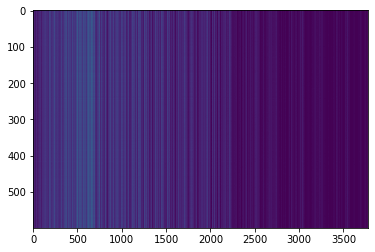

,AUC,pAUC
Source_0,0.690300,0.630526
Source_1,0.754900,0.628421
Source_2,0.802400,0.708421
Target_0,0.625900,0.657895
Target_1,0.786900,0.645263
Target_2,0.694900,0.544211
mean,0.725883,0.635789
h_mean,0.720535,0.631836


2021-05-31 23:25:45,934 - pytorch_modeler.py - INFO - epoch:42/100, train_losses:674.742045, val_AUC_hmean:0.720535, val_pAUC_hmean:0.631836, best_flag:True
2021-05-31 23:25:45,935 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  8.99it/s]
2021-05-31 23:25:47,272 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 39.66it/s]
2021-05-31 23:25:47,341 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 43.62it/s]
2021-05-31 23:25:47,414 - pytorch_modeler.py - INFO - epoch:43/100, train_losses:666.664597, val_AUC_hmean:0.712874, val_pAUC_hmean:0.618810, best_flag:False
2021-05-31 23:25:47,415 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  9.14it/s]
2021-05-31 23:25:48,730 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 52.50it/s]
2021-05-31 23:25:48,791 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 59.79it/s]
2021-05-31 23:25:

100%|██████████| 2/2 [00:00<00:00, 59.96it/s]
2021-05-31 23:26:09,218 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 58.64it/s]
2021-05-31 23:26:09,274 - pytorch_modeler.py - INFO - epoch:59/100, train_losses:595.147115, val_AUC_hmean:0.731860, val_pAUC_hmean:0.622494, best_flag:False
2021-05-31 23:26:09,275 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  9.48it/s]
2021-05-31 23:26:10,543 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 41.94it/s]
2021-05-31 23:26:10,610 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 73.45it/s]
2021-05-31 23:26:10,660 - pytorch_modeler.py - INFO - epoch:60/100, train_losses:592.092733, val_AUC_hmean:0.731104, val_pAUC_hmean:0.624137, best_flag:False
2021-05-31 23:26:10,661 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  9.62it/s]
2021-05-31 23:26:11,911 - pytorch_modeler.py - INFO - valid_source
100%|██████████|

100%|██████████| 12/12 [00:00<00:00, 16.49it/s]
2021-05-31 23:26:30,813 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 83.31it/s]
2021-05-31 23:26:30,855 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 84.73it/s]
2021-05-31 23:26:30,900 - pytorch_modeler.py - INFO - epoch:76/100, train_losses:528.538244, val_AUC_hmean:0.724595, val_pAUC_hmean:0.618979, best_flag:False
2021-05-31 23:26:30,901 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.45it/s]
2021-05-31 23:26:31,632 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 83.54it/s]
2021-05-31 23:26:31,674 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 84.38it/s]
2021-05-31 23:26:31,720 - pytorch_modeler.py - INFO - epoch:77/100, train_losses:524.711629, val_AUC_hmean:0.730384, val_pAUC_hmean:0.620162, best_flag:False
2021-05-31 23:26:31,721 - pytorch_modeler.py - INFO - train
100%|██████████|

2021-05-31 23:26:44,089 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.38it/s]
2021-05-31 23:26:44,824 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 85.04it/s]
2021-05-31 23:26:44,865 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 85.33it/s]
2021-05-31 23:26:44,909 - pytorch_modeler.py - INFO - epoch:93/100, train_losses:464.784587, val_AUC_hmean:0.726965, val_pAUC_hmean:0.619575, best_flag:False
2021-05-31 23:26:44,910 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.34it/s]
2021-05-31 23:26:45,646 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 82.85it/s]
2021-05-31 23:26:45,687 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 79.30it/s]
2021-05-31 23:26:45,735 - pytorch_modeler.py - INFO - epoch:94/100, train_losses:463.094404, val_AUC_hmean:0.725872, val_pAUC_hmean:0.621384, best_flag:False
2021-05-31 23:26

,AUC,pAUC
Source_0,0.690300,0.630526
Source_1,0.754900,0.628421
Source_2,0.802400,0.708421
Target_0,0.625900,0.657895
Target_1,0.786900,0.645263
Target_2,0.694900,0.544211
mean,0.725883,0.635789
h_mean,0.720535,0.631836


2021-05-31 23:26:50,767 - 00_train.py - INFO - TARGET MACHINE_TYPE: gearbox
2021-05-31 23:26:50,768 - 00_train.py - INFO - MAKE DATA_LOADER
2021-05-31 23:26:50,782 - 00_train.py - INFO - TRAINING


elapsed time: 159.716317415 [sec]


2021-05-31 23:26:51,312 - pytorch_modeler.py - INFO - train
 17%|█▋        | 2/12 [00:00<00:00, 16.72it/s]

use: cuda:0


100%|██████████| 12/12 [00:00<00:00, 16.39it/s]
2021-05-31 23:26:52,046 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 82.25it/s]
2021-05-31 23:26:52,088 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 87.27it/s]


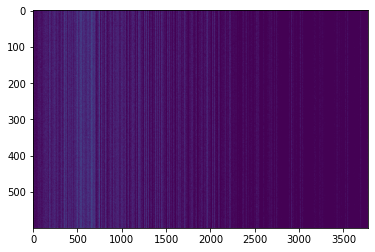

,AUC,pAUC
Source_0,0.528900,0.534211
Source_1,0.561000,0.524737
Source_2,0.600800,0.553684
Target_0,0.487200,0.541579
Target_1,0.677350,0.598947
Target_2,0.538700,0.488947
mean,0.565658,0.540351
h_mean,0.559550,0.538359


2021-05-31 23:26:53,862 - pytorch_modeler.py - INFO - epoch:1/100, train_losses:2497.246775, val_AUC_hmean:0.559550, val_pAUC_hmean:0.538359, best_flag:True
2021-05-31 23:26:53,863 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.40it/s]
2021-05-31 23:26:54,597 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 83.09it/s]
2021-05-31 23:26:54,638 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 86.09it/s]


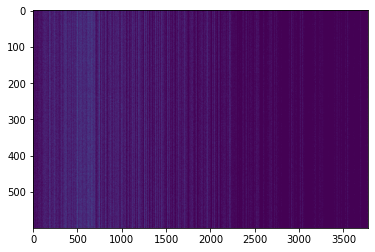

,AUC,pAUC
Source_0,0.554700,0.548421
Source_1,0.599000,0.547368
Source_2,0.624300,0.573158
Target_0,0.536000,0.585263
Target_1,0.689300,0.572105
Target_2,0.620800,0.509474
mean,0.604017,0.555965
h_mean,0.599924,0.554814


2021-05-31 23:26:56,421 - pytorch_modeler.py - INFO - epoch:2/100, train_losses:1527.743591, val_AUC_hmean:0.599924, val_pAUC_hmean:0.554814, best_flag:True
2021-05-31 23:26:56,422 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.37it/s]
2021-05-31 23:26:57,157 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 87.52it/s]
2021-05-31 23:26:57,197 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 82.31it/s]


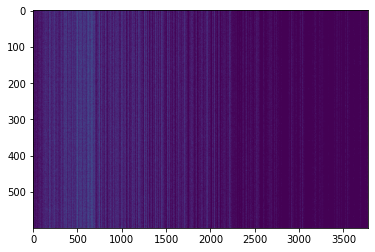

,AUC,pAUC
Source_0,0.56380,0.563158
Source_1,0.64020,0.584211
Source_2,0.63310,0.571053
Target_0,0.53900,0.599474
Target_1,0.68970,0.571053
Target_2,0.61550,0.512105
mean,0.61355,0.566842
h_mean,0.60944,0.565474


2021-05-31 23:26:58,994 - pytorch_modeler.py - INFO - epoch:3/100, train_losses:1179.104716, val_AUC_hmean:0.609440, val_pAUC_hmean:0.565474, best_flag:True
2021-05-31 23:26:58,995 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.24it/s]
2021-05-31 23:26:59,735 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 87.88it/s]
2021-05-31 23:26:59,776 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 86.22it/s]


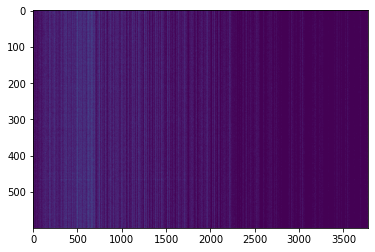

,AUC,pAUC
Source_0,0.567800,0.573158
Source_1,0.674400,0.576316
Source_2,0.686300,0.574211
Target_0,0.543600,0.606842
Target_1,0.698900,0.578947
Target_2,0.624800,0.503158
mean,0.632633,0.568772
h_mean,0.626829,0.566894


2021-05-31 23:27:01,579 - pytorch_modeler.py - INFO - epoch:4/100, train_losses:1040.593435, val_AUC_hmean:0.626829, val_pAUC_hmean:0.566894, best_flag:True
2021-05-31 23:27:01,580 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.27it/s]
2021-05-31 23:27:02,319 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 85.09it/s]
2021-05-31 23:27:02,361 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 85.40it/s]


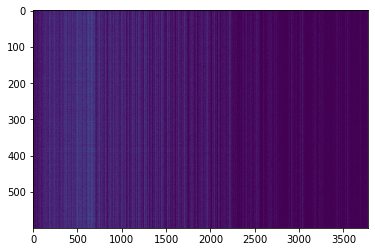

,AUC,pAUC
Source_0,0.582600,0.584211
Source_1,0.683900,0.580526
Source_2,0.755900,0.584737
Target_0,0.549100,0.613684
Target_1,0.702900,0.572632
Target_2,0.647500,0.500526
mean,0.653650,0.572719
h_mean,0.645869,0.570441


2021-05-31 23:27:04,147 - pytorch_modeler.py - INFO - epoch:5/100, train_losses:966.681371, val_AUC_hmean:0.645869, val_pAUC_hmean:0.570441, best_flag:True
2021-05-31 23:27:04,148 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.35it/s]
2021-05-31 23:27:04,884 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 79.67it/s]
2021-05-31 23:27:04,927 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 88.38it/s]


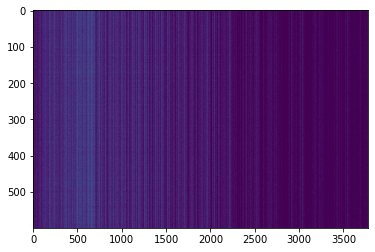

,AUC,pAUC
Source_0,0.591300,0.587895
Source_1,0.689400,0.577895
Source_2,0.787700,0.675789
Target_0,0.563300,0.626842
Target_1,0.712900,0.592632
Target_2,0.667500,0.503158
mean,0.668683,0.594035
h_mean,0.660259,0.589316


2021-05-31 23:27:06,734 - pytorch_modeler.py - INFO - epoch:6/100, train_losses:923.962011, val_AUC_hmean:0.660259, val_pAUC_hmean:0.589316, best_flag:True
2021-05-31 23:27:06,735 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.45it/s]
2021-05-31 23:27:07,467 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 86.78it/s]
2021-05-31 23:27:07,508 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 87.63it/s]
2021-05-31 23:27:07,568 - pytorch_modeler.py - INFO - epoch:7/100, train_losses:896.812251, val_AUC_hmean:0.656496, val_pAUC_hmean:0.585814, best_flag:False
2021-05-31 23:27:07,570 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.29it/s]
2021-05-31 23:27:08,308 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 83.89it/s]
2021-05-31 23:27:08,350 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 85.32it/s]


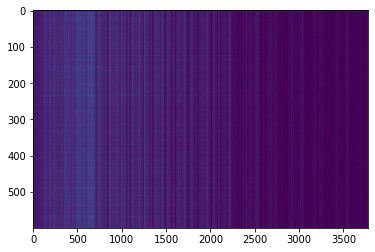

,AUC,pAUC
Source_0,0.622700,0.592105
Source_1,0.719100,0.612105
Source_2,0.784900,0.653684
Target_0,0.577500,0.640000
Target_1,0.715300,0.579474
Target_2,0.623200,0.497368
mean,0.673783,0.595789
h_mean,0.666310,0.591065


2021-05-31 23:27:10,150 - pytorch_modeler.py - INFO - epoch:8/100, train_losses:878.828527, val_AUC_hmean:0.666310, val_pAUC_hmean:0.591065, best_flag:True
2021-05-31 23:27:10,151 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.54it/s]
2021-05-31 23:27:10,878 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 87.82it/s]
2021-05-31 23:27:10,919 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 86.36it/s]


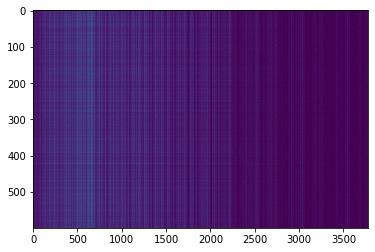

,AUC,pAUC
Source_0,0.616300,0.596842
Source_1,0.709400,0.606842
Source_2,0.794900,0.680000
Target_0,0.574600,0.632632
Target_1,0.728100,0.600000
Target_2,0.652400,0.500000
mean,0.679283,0.602719
h_mean,0.671379,0.597531


2021-05-31 23:27:12,732 - pytorch_modeler.py - INFO - epoch:9/100, train_losses:858.970393, val_AUC_hmean:0.671379, val_pAUC_hmean:0.597531, best_flag:True
2021-05-31 23:27:12,733 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.47it/s]
2021-05-31 23:27:13,463 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 80.46it/s]
2021-05-31 23:27:13,507 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 88.63it/s]


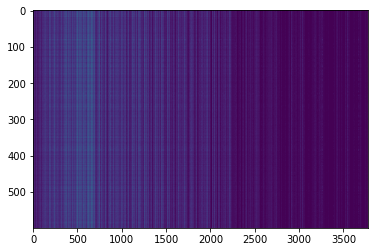

,AUC,pAUC
Source_0,0.645700,0.605789
Source_1,0.683100,0.576842
Source_2,0.818000,0.690526
Target_0,0.588800,0.630000
Target_1,0.712300,0.596316
Target_2,0.678700,0.518947
mean,0.687767,0.603070
h_mean,0.680983,0.598580


2021-05-31 23:27:15,413 - pytorch_modeler.py - INFO - epoch:10/100, train_losses:843.507751, val_AUC_hmean:0.680983, val_pAUC_hmean:0.598580, best_flag:True
2021-05-31 23:27:15,414 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.41it/s]
2021-05-31 23:27:16,147 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 85.99it/s]
2021-05-31 23:27:16,188 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 74.77it/s]
2021-05-31 23:27:16,241 - pytorch_modeler.py - INFO - epoch:11/100, train_losses:827.865234, val_AUC_hmean:0.674109, val_pAUC_hmean:0.593987, best_flag:False
2021-05-31 23:27:16,242 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.60it/s]
2021-05-31 23:27:16,967 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 80.35it/s]
2021-05-31 23:27:17,009 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 85.84it/s]


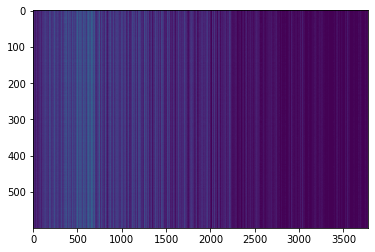

,AUC,pAUC
Source_0,0.635500,0.613684
Source_1,0.714200,0.602105
Source_2,0.793200,0.696842
Target_0,0.588300,0.637368
Target_1,0.721900,0.601579
Target_2,0.639300,0.519474
mean,0.682067,0.611842
h_mean,0.675394,0.607186


2021-05-31 23:27:18,934 - pytorch_modeler.py - INFO - epoch:12/100, train_losses:815.378357, val_AUC_hmean:0.675394, val_pAUC_hmean:0.607186, best_flag:True
2021-05-31 23:27:18,935 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.34it/s]
2021-05-31 23:27:19,670 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 85.31it/s]
2021-05-31 23:27:19,713 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 81.13it/s]
2021-05-31 23:27:19,759 - pytorch_modeler.py - INFO - epoch:13/100, train_losses:805.317968, val_AUC_hmean:0.682142, val_pAUC_hmean:0.599993, best_flag:False
2021-05-31 23:27:19,760 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.50it/s]
2021-05-31 23:27:20,489 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 75.51it/s]
2021-05-31 23:27:20,537 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 88.64it/s]


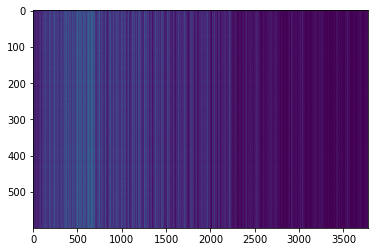

,AUC,pAUC
Source_0,0.638300,0.613684
Source_1,0.740100,0.611579
Source_2,0.802400,0.703158
Target_0,0.581500,0.645789
Target_1,0.743200,0.601579
Target_2,0.655500,0.507895
mean,0.693500,0.613947
h_mean,0.685333,0.608120


2021-05-31 23:27:22,478 - pytorch_modeler.py - INFO - epoch:14/100, train_losses:794.470957, val_AUC_hmean:0.685333, val_pAUC_hmean:0.608120, best_flag:True
2021-05-31 23:27:22,479 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.29it/s]
2021-05-31 23:27:23,217 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 85.00it/s]
2021-05-31 23:27:23,259 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 85.78it/s]


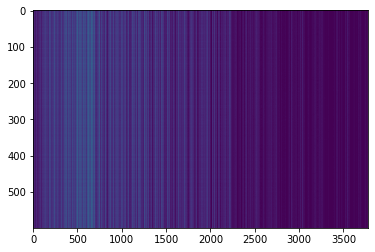

,AUC,pAUC
Source_0,0.659300,0.621053
Source_1,0.726600,0.613158
Source_2,0.810300,0.721579
Target_0,0.599000,0.647895
Target_1,0.743400,0.611053
Target_2,0.668900,0.516842
mean,0.701250,0.621930
h_mean,0.694705,0.615907


2021-05-31 23:27:25,119 - pytorch_modeler.py - INFO - epoch:15/100, train_losses:785.521642, val_AUC_hmean:0.694705, val_pAUC_hmean:0.615907, best_flag:True
2021-05-31 23:27:25,120 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.40it/s]
2021-05-31 23:27:25,854 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 82.98it/s]
2021-05-31 23:27:25,896 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 86.26it/s]


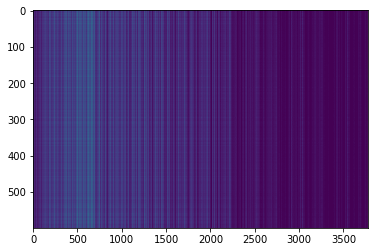

,AUC,pAUC
Source_0,0.657300,0.618421
Source_1,0.754100,0.657368
Source_2,0.796800,0.719474
Target_0,0.604200,0.650000
Target_1,0.768300,0.618947
Target_2,0.677900,0.516316
mean,0.709767,0.630088
h_mean,0.703047,0.623762


2021-05-31 23:27:27,809 - pytorch_modeler.py - INFO - epoch:16/100, train_losses:775.466644, val_AUC_hmean:0.703047, val_pAUC_hmean:0.623762, best_flag:True
2021-05-31 23:27:27,810 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.30it/s]
2021-05-31 23:27:28,548 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 87.21it/s]
2021-05-31 23:27:28,588 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 87.15it/s]
2021-05-31 23:27:28,632 - pytorch_modeler.py - INFO - epoch:17/100, train_losses:767.538701, val_AUC_hmean:0.689211, val_pAUC_hmean:0.610771, best_flag:False
2021-05-31 23:27:28,633 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.49it/s]
2021-05-31 23:27:29,363 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 86.23it/s]
2021-05-31 23:27:29,404 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 86.69it/s]
2021-05-31 23:27:

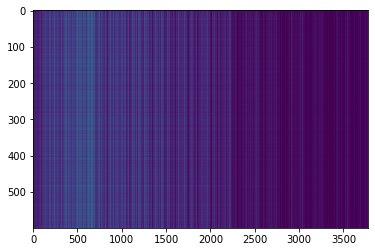

,AUC,pAUC
Source_0,0.678000,0.643684
Source_1,0.745900,0.628947
Source_2,0.822200,0.719474
Target_0,0.616300,0.653684
Target_1,0.770100,0.639474
Target_2,0.688200,0.522632
mean,0.720117,0.634649
h_mean,0.713774,0.628905


2021-05-31 23:27:37,895 - pytorch_modeler.py - INFO - epoch:26/100, train_losses:708.204600, val_AUC_hmean:0.713774, val_pAUC_hmean:0.628905, best_flag:True
2021-05-31 23:27:37,896 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.44it/s]
2021-05-31 23:27:38,628 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 87.31it/s]
2021-05-31 23:27:38,669 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 85.00it/s]
2021-05-31 23:27:38,715 - pytorch_modeler.py - INFO - epoch:27/100, train_losses:703.096298, val_AUC_hmean:0.706862, val_pAUC_hmean:0.626650, best_flag:False
2021-05-31 23:27:38,716 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.36it/s]
2021-05-31 23:27:39,452 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 83.19it/s]
2021-05-31 23:27:39,493 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 85.41it/s]
2021-05-31 23:27:

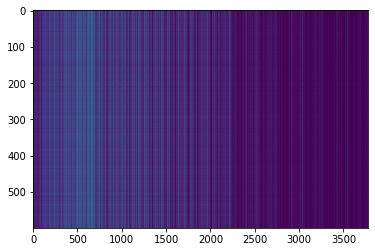

,AUC,pAUC
Source_0,0.697800,0.645263
Source_1,0.749800,0.652105
Source_2,0.811300,0.722632
Target_0,0.621700,0.644211
Target_1,0.772400,0.635789
Target_2,0.665200,0.516842
mean,0.719700,0.636140
h_mean,0.713791,0.629786


2021-05-31 23:27:42,168 - pytorch_modeler.py - INFO - epoch:29/100, train_losses:691.045359, val_AUC_hmean:0.713791, val_pAUC_hmean:0.629786, best_flag:True
2021-05-31 23:27:42,169 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.50it/s]
2021-05-31 23:27:42,898 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 85.21it/s]
2021-05-31 23:27:42,939 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 87.86it/s]
2021-05-31 23:27:42,982 - pytorch_modeler.py - INFO - epoch:30/100, train_losses:687.673716, val_AUC_hmean:0.707705, val_pAUC_hmean:0.616134, best_flag:False
2021-05-31 23:27:42,983 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.51it/s]
2021-05-31 23:27:43,711 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 85.96it/s]
2021-05-31 23:27:43,752 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 85.28it/s]
2021-05-31 23:27:

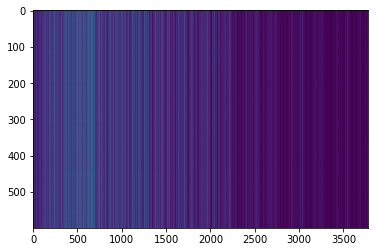

,AUC,pAUC
Source_0,0.682800,0.631053
Source_1,0.752900,0.640526
Source_2,0.831100,0.721579
Target_0,0.615400,0.646842
Target_1,0.791500,0.665263
Target_2,0.681300,0.516842
mean,0.725833,0.637018
h_mean,0.718378,0.630538


2021-05-31 23:27:49,748 - pytorch_modeler.py - INFO - epoch:36/100, train_losses:656.292669, val_AUC_hmean:0.718378, val_pAUC_hmean:0.630538, best_flag:True
2021-05-31 23:27:49,749 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.30it/s]
2021-05-31 23:27:50,487 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 86.76it/s]
2021-05-31 23:27:50,527 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 87.29it/s]
2021-05-31 23:27:50,571 - pytorch_modeler.py - INFO - epoch:37/100, train_losses:649.255839, val_AUC_hmean:0.717541, val_pAUC_hmean:0.627495, best_flag:False
2021-05-31 23:27:50,572 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.33it/s]
2021-05-31 23:27:51,309 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 87.59it/s]
2021-05-31 23:27:51,349 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 87.29it/s]
2021-05-31 23:27:

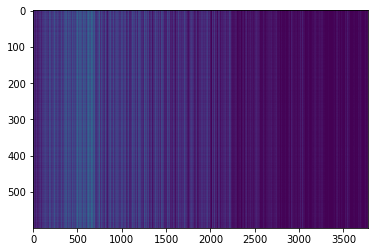

,AUC,pAUC
Source_0,0.754800,0.652632
Source_1,0.751900,0.651579
Source_2,0.829800,0.717895
Target_0,0.650700,0.661579
Target_1,0.783100,0.638421
Target_2,0.664100,0.512632
mean,0.739067,0.639123
h_mean,0.733540,0.632340


2021-05-31 23:27:58,933 - pytorch_modeler.py - INFO - epoch:45/100, train_losses:610.682576, val_AUC_hmean:0.733540, val_pAUC_hmean:0.632340, best_flag:True
2021-05-31 23:27:58,934 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 15.84it/s]
2021-05-31 23:27:59,694 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 77.60it/s]
2021-05-31 23:27:59,739 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 76.27it/s]
2021-05-31 23:27:59,789 - pytorch_modeler.py - INFO - epoch:46/100, train_losses:607.639420, val_AUC_hmean:0.725428, val_pAUC_hmean:0.628154, best_flag:False
2021-05-31 23:27:59,790 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 14.84it/s]
2021-05-31 23:28:00,600 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 85.34it/s]
2021-05-31 23:28:00,642 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 84.24it/s]
2021-05-31 23:28:

100%|██████████| 2/2 [00:00<00:00, 83.60it/s]
2021-05-31 23:28:13,300 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 86.88it/s]
2021-05-31 23:28:13,344 - pytorch_modeler.py - INFO - epoch:62/100, train_losses:541.835149, val_AUC_hmean:0.730350, val_pAUC_hmean:0.624965, best_flag:False
2021-05-31 23:28:13,345 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.54it/s]
2021-05-31 23:28:14,072 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 86.04it/s]
2021-05-31 23:28:14,113 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 87.24it/s]


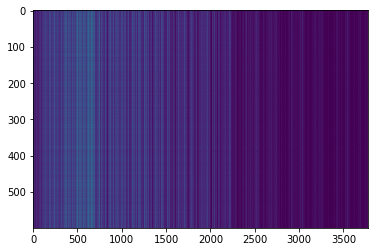

,AUC,pAUC
Source_0,0.741400,0.645263
Source_1,0.755200,0.646842
Source_2,0.828800,0.712632
Target_0,0.651300,0.660526
Target_1,0.793500,0.654211
Target_2,0.656000,0.513684
mean,0.737700,0.638860
h_mean,0.731749,0.632364


2021-05-31 23:28:15,905 - pytorch_modeler.py - INFO - epoch:63/100, train_losses:535.667130, val_AUC_hmean:0.731749, val_pAUC_hmean:0.632364, best_flag:True
2021-05-31 23:28:15,906 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.48it/s]
2021-05-31 23:28:16,636 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 83.90it/s]
2021-05-31 23:28:16,678 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 86.11it/s]
2021-05-31 23:28:16,724 - pytorch_modeler.py - INFO - epoch:64/100, train_losses:532.218501, val_AUC_hmean:0.729999, val_pAUC_hmean:0.629127, best_flag:False
2021-05-31 23:28:16,725 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.60it/s]
2021-05-31 23:28:17,450 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 85.31it/s]
2021-05-31 23:28:17,492 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 87.24it/s]
2021-05-31 23:28:

100%|██████████| 2/2 [00:00<00:00, 87.09it/s]
2021-05-31 23:28:29,782 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 85.88it/s]
2021-05-31 23:28:29,826 - pytorch_modeler.py - INFO - epoch:80/100, train_losses:472.027685, val_AUC_hmean:0.730014, val_pAUC_hmean:0.625962, best_flag:False
2021-05-31 23:28:29,827 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.20it/s]
2021-05-31 23:28:30,569 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 80.63it/s]
2021-05-31 23:28:30,613 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 84.00it/s]
2021-05-31 23:28:30,660 - pytorch_modeler.py - INFO - epoch:81/100, train_losses:466.988436, val_AUC_hmean:0.729379, val_pAUC_hmean:0.624668, best_flag:False
2021-05-31 23:28:30,661 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.50it/s]
2021-05-31 23:28:31,390 - pytorch_modeler.py - INFO - valid_source
100%|██████████|

100%|██████████| 12/12 [00:00<00:00, 16.45it/s]
2021-05-31 23:28:43,922 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 80.77it/s]
2021-05-31 23:28:43,964 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 86.95it/s]
2021-05-31 23:28:44,008 - pytorch_modeler.py - INFO - epoch:97/100, train_losses:414.326884, val_AUC_hmean:0.725312, val_pAUC_hmean:0.625056, best_flag:False
2021-05-31 23:28:44,009 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.36it/s]
2021-05-31 23:28:44,744 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 87.19it/s]
2021-05-31 23:28:44,785 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 82.72it/s]
2021-05-31 23:28:44,829 - pytorch_modeler.py - INFO - epoch:98/100, train_losses:411.958504, val_AUC_hmean:0.734984, val_pAUC_hmean:0.626933, best_flag:False
2021-05-31 23:28:44,830 - pytorch_modeler.py - INFO - train
100%|██████████|

,AUC,pAUC
Source_0,0.741400,0.645263
Source_1,0.755200,0.646842
Source_2,0.828800,0.712632
Target_0,0.651300,0.660526
Target_1,0.793500,0.654211
Target_2,0.656000,0.513684
mean,0.737700,0.638860
h_mean,0.731749,0.632364


2021-05-31 23:28:46,472 - 00_train.py - INFO - TARGET MACHINE_TYPE: valve
2021-05-31 23:28:46,473 - 00_train.py - INFO - MAKE DATA_LOADER
2021-05-31 23:28:46,495 - 00_train.py - INFO - TRAINING


elapsed time: 115.704468012 [sec]


2021-05-31 23:28:46,991 - pytorch_modeler.py - INFO - train
 17%|█▋        | 2/12 [00:00<00:00, 16.82it/s]

use: cuda:0


100%|██████████| 12/12 [00:00<00:00, 16.37it/s]
2021-05-31 23:28:47,726 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 83.75it/s]
2021-05-31 23:28:47,768 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 84.66it/s]


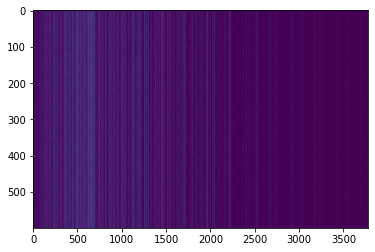

,AUC,pAUC
Source_0,0.532900,0.534737
Source_1,0.567300,0.528421
Source_2,0.614100,0.549474
Target_0,0.486900,0.530000
Target_1,0.659400,0.578947
Target_2,0.519700,0.500000
mean,0.563383,0.536930
h_mean,0.557508,0.535882


2021-05-31 23:28:49,573 - pytorch_modeler.py - INFO - epoch:1/100, train_losses:2499.012217, val_AUC_hmean:0.557508, val_pAUC_hmean:0.535882, best_flag:True
2021-05-31 23:28:49,574 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.13it/s]
2021-05-31 23:28:50,320 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 85.43it/s]
2021-05-31 23:28:50,362 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 87.19it/s]


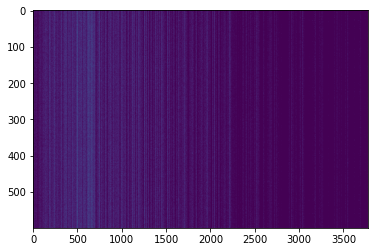

,AUC,pAUC
Source_0,0.550500,0.545789
Source_1,0.571400,0.522632
Source_2,0.643500,0.570526
Target_0,0.522100,0.586842
Target_1,0.680900,0.576842
Target_2,0.624800,0.508421
mean,0.598867,0.551842
h_mean,0.593759,0.550315


2021-05-31 23:28:52,290 - pytorch_modeler.py - INFO - epoch:2/100, train_losses:1545.769918, val_AUC_hmean:0.593759, val_pAUC_hmean:0.550315, best_flag:True
2021-05-31 23:28:52,291 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 15.98it/s]
2021-05-31 23:28:53,044 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 83.33it/s]
2021-05-31 23:28:53,087 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 84.90it/s]


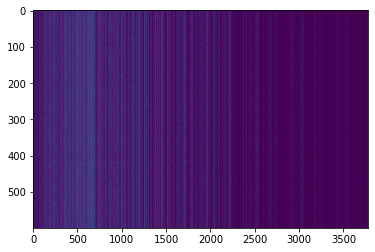

,AUC,pAUC
Source_0,0.552200,0.546316
Source_1,0.621800,0.553684
Source_2,0.633300,0.533684
Target_0,0.532800,0.587895
Target_1,0.677400,0.564737
Target_2,0.593200,0.546316
mean,0.601783,0.555439
h_mean,0.597783,0.554915


2021-05-31 23:28:55,292 - pytorch_modeler.py - INFO - epoch:3/100, train_losses:1192.240865, val_AUC_hmean:0.597783, val_pAUC_hmean:0.554915, best_flag:True
2021-05-31 23:28:55,292 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.26it/s]
2021-05-31 23:28:56,032 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 86.94it/s]
2021-05-31 23:28:56,072 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 87.40it/s]


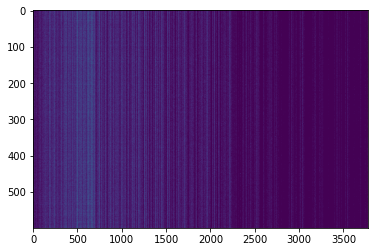

,AUC,pAUC
Source_0,0.555200,0.548947
Source_1,0.666500,0.602632
Source_2,0.700600,0.581579
Target_0,0.532500,0.602632
Target_1,0.701200,0.578947
Target_2,0.618900,0.503684
mean,0.629150,0.569737
h_mean,0.621845,0.567508


2021-05-31 23:28:58,002 - pytorch_modeler.py - INFO - epoch:4/100, train_losses:1043.820989, val_AUC_hmean:0.621845, val_pAUC_hmean:0.567508, best_flag:True
2021-05-31 23:28:58,004 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.13it/s]
2021-05-31 23:28:58,750 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 85.10it/s]
2021-05-31 23:28:58,792 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 83.83it/s]


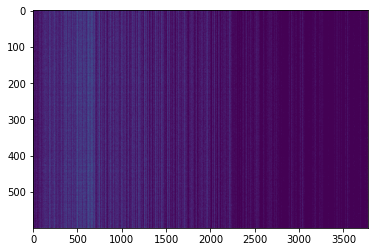

,AUC,pAUC
Source_0,0.558000,0.554737
Source_1,0.645000,0.555789
Source_2,0.786900,0.623684
Target_0,0.533400,0.617368
Target_1,0.673000,0.567368
Target_2,0.642500,0.508421
mean,0.639800,0.571228
h_mean,0.629566,0.568481


2021-05-31 23:29:00,681 - pytorch_modeler.py - INFO - epoch:5/100, train_losses:974.977773, val_AUC_hmean:0.629566, val_pAUC_hmean:0.568481, best_flag:True
2021-05-31 23:29:00,682 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.21it/s]
2021-05-31 23:29:01,425 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 84.56it/s]
2021-05-31 23:29:01,466 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 87.75it/s]


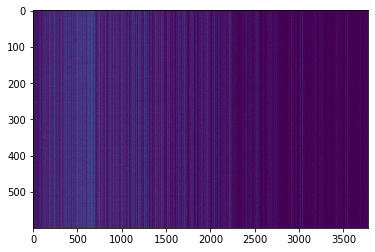

,AUC,pAUC
Source_0,0.573800,0.572105
Source_1,0.705600,0.593684
Source_2,0.799900,0.625789
Target_0,0.536300,0.618947
Target_1,0.707500,0.582105
Target_2,0.630300,0.501053
mean,0.658900,0.582281
h_mean,0.646917,0.579170


2021-05-31 23:29:03,379 - pytorch_modeler.py - INFO - epoch:6/100, train_losses:932.451884, val_AUC_hmean:0.646917, val_pAUC_hmean:0.579170, best_flag:True
2021-05-31 23:29:03,380 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.55it/s]
2021-05-31 23:29:04,107 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 87.06it/s]
2021-05-31 23:29:04,147 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 86.73it/s]


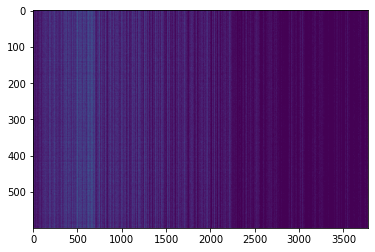

,AUC,pAUC
Source_0,0.591600,0.581579
Source_1,0.725100,0.600000
Source_2,0.786600,0.655789
Target_0,0.559000,0.631579
Target_1,0.716100,0.591053
Target_2,0.612800,0.522632
mean,0.665200,0.597105
h_mean,0.655168,0.594081


2021-05-31 23:29:06,078 - pytorch_modeler.py - INFO - epoch:7/100, train_losses:907.502477, val_AUC_hmean:0.655168, val_pAUC_hmean:0.594081, best_flag:True
2021-05-31 23:29:06,079 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.31it/s]
2021-05-31 23:29:06,816 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 86.11it/s]
2021-05-31 23:29:06,858 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 85.91it/s]


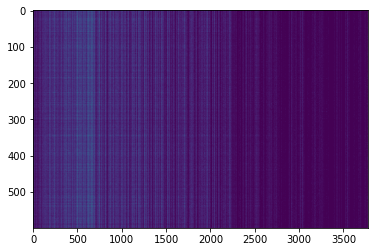

,AUC,pAUC
Source_0,0.591200,0.587368
Source_1,0.703800,0.615263
Source_2,0.809400,0.677368
Target_0,0.544300,0.628421
Target_1,0.713900,0.598421
Target_2,0.634800,0.508421
mean,0.666233,0.602544
h_mean,0.654944,0.598005


2021-05-31 23:29:08,854 - pytorch_modeler.py - INFO - epoch:8/100, train_losses:880.411865, val_AUC_hmean:0.654944, val_pAUC_hmean:0.598005, best_flag:True
2021-05-31 23:29:08,855 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.38it/s]
2021-05-31 23:29:09,589 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 87.59it/s]
2021-05-31 23:29:09,630 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 87.20it/s]
2021-05-31 23:29:09,674 - pytorch_modeler.py - INFO - epoch:9/100, train_losses:862.031011, val_AUC_hmean:0.649687, val_pAUC_hmean:0.580427, best_flag:False
2021-05-31 23:29:09,675 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.24it/s]
2021-05-31 23:29:10,416 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 84.23it/s]
2021-05-31 23:29:10,457 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 86.58it/s]
2021-05-31 23:29:10

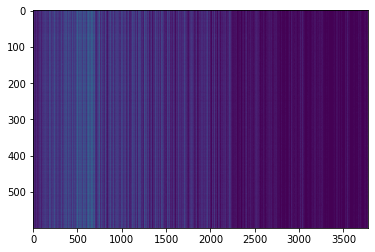

,AUC,pAUC
Source_0,0.610900,0.596316
Source_1,0.676300,0.575789
Source_2,0.817300,0.709474
Target_0,0.576500,0.637368
Target_1,0.712700,0.600526
Target_2,0.626900,0.506842
mean,0.670100,0.604386
h_mean,0.661377,0.598184


2021-05-31 23:29:13,160 - pytorch_modeler.py - INFO - epoch:11/100, train_losses:833.524282, val_AUC_hmean:0.661377, val_pAUC_hmean:0.598184, best_flag:True
2021-05-31 23:29:13,161 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 15.79it/s]
2021-05-31 23:29:13,922 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 15.16it/s]
2021-05-31 23:29:14,072 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 86.12it/s]


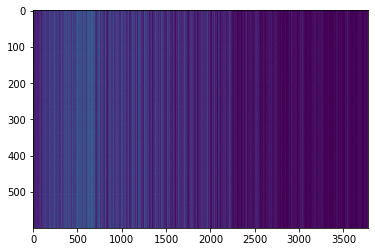

,AUC,pAUC
Source_0,0.611400,0.606842
Source_1,0.698800,0.584737
Source_2,0.837800,0.699474
Target_0,0.559600,0.634211
Target_1,0.704300,0.599474
Target_2,0.664100,0.531579
mean,0.679333,0.609386
h_mean,0.668683,0.605219


2021-05-31 23:29:15,946 - pytorch_modeler.py - INFO - epoch:12/100, train_losses:822.086004, val_AUC_hmean:0.668683, val_pAUC_hmean:0.605219, best_flag:True
2021-05-31 23:29:15,947 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.47it/s]
2021-05-31 23:29:16,678 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 84.37it/s]
2021-05-31 23:29:16,721 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 81.77it/s]


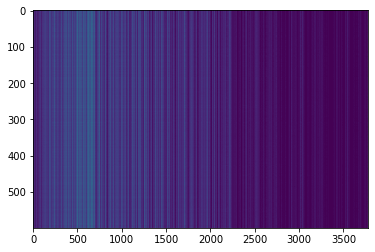

,AUC,pAUC
Source_0,0.614400,0.613684
Source_1,0.733200,0.634211
Source_2,0.817800,0.710526
Target_0,0.568100,0.634737
Target_1,0.750100,0.618421
Target_2,0.670000,0.534737
mean,0.692267,0.624386
h_mean,0.681801,0.620076


2021-05-31 23:29:18,544 - pytorch_modeler.py - INFO - epoch:13/100, train_losses:809.169652, val_AUC_hmean:0.681801, val_pAUC_hmean:0.620076, best_flag:True
2021-05-31 23:29:18,545 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.41it/s]
2021-05-31 23:29:19,278 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 83.58it/s]
2021-05-31 23:29:19,320 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 85.22it/s]
2021-05-31 23:29:19,365 - pytorch_modeler.py - INFO - epoch:14/100, train_losses:803.454936, val_AUC_hmean:0.664426, val_pAUC_hmean:0.608895, best_flag:False
2021-05-31 23:29:19,366 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.46it/s]
2021-05-31 23:29:20,096 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 86.98it/s]
2021-05-31 23:29:20,137 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 87.23it/s]


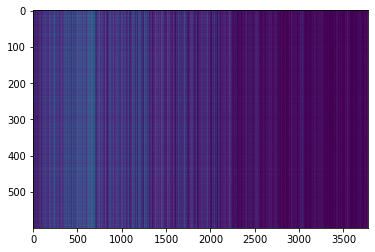

,AUC,pAUC
Source_0,0.613200,0.613684
Source_1,0.725600,0.630000
Source_2,0.817500,0.717895
Target_0,0.567200,0.646316
Target_1,0.747700,0.614211
Target_2,0.680800,0.541053
mean,0.692000,0.627193
h_mean,0.681699,0.622836


2021-05-31 23:29:21,939 - pytorch_modeler.py - INFO - epoch:15/100, train_losses:791.954320, val_AUC_hmean:0.681699, val_pAUC_hmean:0.622836, best_flag:True
2021-05-31 23:29:21,940 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.37it/s]
2021-05-31 23:29:22,675 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 86.56it/s]
2021-05-31 23:29:22,717 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 85.22it/s]
2021-05-31 23:29:22,761 - pytorch_modeler.py - INFO - epoch:16/100, train_losses:785.591644, val_AUC_hmean:0.684978, val_pAUC_hmean:0.613644, best_flag:False
2021-05-31 23:29:22,762 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.50it/s]
2021-05-31 23:29:23,491 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 86.99it/s]
2021-05-31 23:29:23,532 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 87.24it/s]
2021-05-31 23:29:

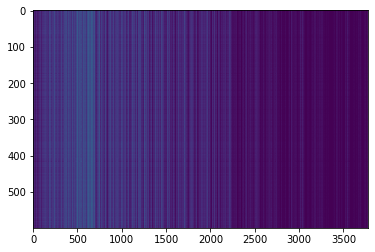

,AUC,pAUC
Source_0,0.664900,0.625789
Source_1,0.725700,0.597895
Source_2,0.828300,0.732105
Target_0,0.609700,0.652105
Target_1,0.749300,0.624737
Target_2,0.680900,0.550526
mean,0.709800,0.630526
h_mean,0.703183,0.625844


2021-05-31 23:29:29,524 - pytorch_modeler.py - INFO - epoch:22/100, train_losses:736.016698, val_AUC_hmean:0.703183, val_pAUC_hmean:0.625844, best_flag:True
2021-05-31 23:29:29,525 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.32it/s]
2021-05-31 23:29:30,261 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 85.97it/s]
2021-05-31 23:29:30,303 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 86.05it/s]
2021-05-31 23:29:30,348 - pytorch_modeler.py - INFO - epoch:23/100, train_losses:732.498688, val_AUC_hmean:0.697981, val_pAUC_hmean:0.616038, best_flag:False
2021-05-31 23:29:30,349 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.42it/s]
2021-05-31 23:29:31,081 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 85.82it/s]
2021-05-31 23:29:31,123 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 86.70it/s]


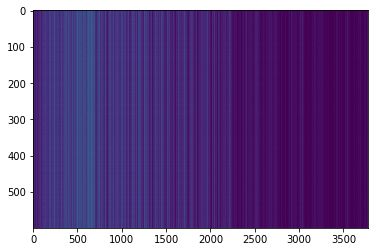

,AUC,pAUC
Source_0,0.654100,0.631579
Source_1,0.749900,0.628421
Source_2,0.817000,0.719474
Target_0,0.588800,0.640526
Target_1,0.784500,0.647368
Target_2,0.681800,0.542105
mean,0.712683,0.634912
h_mean,0.703722,0.630575


2021-05-31 23:29:32,983 - pytorch_modeler.py - INFO - epoch:24/100, train_losses:724.574936, val_AUC_hmean:0.703722, val_pAUC_hmean:0.630575, best_flag:True
2021-05-31 23:29:32,984 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.54it/s]
2021-05-31 23:29:33,712 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 82.44it/s]
2021-05-31 23:29:33,754 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 81.70it/s]


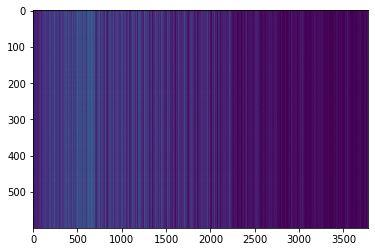

,AUC,pAUC
Source_0,0.656900,0.625263
Source_1,0.751200,0.643684
Source_2,0.805700,0.708947
Target_0,0.597100,0.651053
Target_1,0.801300,0.652105
Target_2,0.674800,0.543684
mean,0.714500,0.637456
h_mean,0.705939,0.633433


2021-05-31 23:29:35,586 - pytorch_modeler.py - INFO - epoch:25/100, train_losses:718.936900, val_AUC_hmean:0.705939, val_pAUC_hmean:0.633433, best_flag:True
2021-05-31 23:29:35,587 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.43it/s]
2021-05-31 23:29:36,319 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 86.79it/s]
2021-05-31 23:29:36,360 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 86.24it/s]
2021-05-31 23:29:36,405 - pytorch_modeler.py - INFO - epoch:26/100, train_losses:712.105123, val_AUC_hmean:0.692084, val_pAUC_hmean:0.614347, best_flag:False
2021-05-31 23:29:36,406 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.47it/s]
2021-05-31 23:29:37,136 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 85.08it/s]
2021-05-31 23:29:37,178 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 84.43it/s]
2021-05-31 23:29:

100%|██████████| 2/2 [00:00<00:00, 85.45it/s]
2021-05-31 23:29:49,572 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 85.50it/s]
2021-05-31 23:29:49,616 - pytorch_modeler.py - INFO - epoch:42/100, train_losses:630.252818, val_AUC_hmean:0.714555, val_pAUC_hmean:0.623838, best_flag:False
2021-05-31 23:29:49,617 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.10it/s]
2021-05-31 23:29:50,365 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 86.80it/s]
2021-05-31 23:29:50,406 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 83.04it/s]
2021-05-31 23:29:50,450 - pytorch_modeler.py - INFO - epoch:43/100, train_losses:625.579941, val_AUC_hmean:0.706459, val_pAUC_hmean:0.618868, best_flag:False
2021-05-31 23:29:50,451 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.40it/s]
2021-05-31 23:29:51,185 - pytorch_modeler.py - INFO - valid_source
100%|██████████|

100%|██████████| 12/12 [00:00<00:00, 16.37it/s]
2021-05-31 23:30:03,502 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 82.89it/s]
2021-05-31 23:30:03,545 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 80.85it/s]
2021-05-31 23:30:03,593 - pytorch_modeler.py - INFO - epoch:59/100, train_losses:555.625163, val_AUC_hmean:0.729790, val_pAUC_hmean:0.631310, best_flag:False
2021-05-31 23:30:03,594 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 15.88it/s]
2021-05-31 23:30:04,352 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 84.80it/s]
2021-05-31 23:30:04,392 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 86.22it/s]


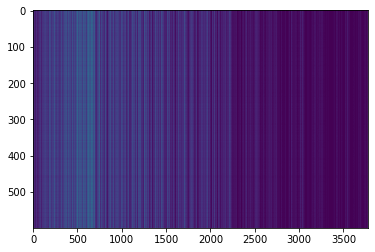

,AUC,pAUC
Source_0,0.736500,0.643684
Source_1,0.761800,0.642632
Source_2,0.812600,0.711579
Target_0,0.648900,0.662632
Target_1,0.770700,0.646316
Target_2,0.666100,0.527895
mean,0.732767,0.639123
h_mean,0.728072,0.633870


2021-05-31 23:30:06,356 - pytorch_modeler.py - INFO - epoch:60/100, train_losses:552.135320, val_AUC_hmean:0.728072, val_pAUC_hmean:0.633870, best_flag:True
2021-05-31 23:30:06,357 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 15.62it/s]
2021-05-31 23:30:07,127 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 84.63it/s]
2021-05-31 23:30:07,168 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 86.45it/s]
2021-05-31 23:30:07,215 - pytorch_modeler.py - INFO - epoch:61/100, train_losses:548.608231, val_AUC_hmean:0.710719, val_pAUC_hmean:0.616361, best_flag:False
2021-05-31 23:30:07,216 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 14.81it/s]
2021-05-31 23:30:08,027 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 81.17it/s]
2021-05-31 23:30:08,071 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 82.37it/s]


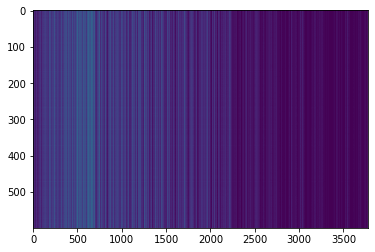

,AUC,pAUC
Source_0,0.749300,0.645789
Source_1,0.755200,0.638947
Source_2,0.821400,0.725789
Target_0,0.659100,0.655263
Target_1,0.773500,0.645789
Target_2,0.673300,0.534211
mean,0.738633,0.640965
h_mean,0.734265,0.635735


2021-05-31 23:30:09,972 - pytorch_modeler.py - INFO - epoch:62/100, train_losses:544.939875, val_AUC_hmean:0.734265, val_pAUC_hmean:0.635735, best_flag:True
2021-05-31 23:30:09,973 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 15.73it/s]
2021-05-31 23:30:10,737 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 86.80it/s]
2021-05-31 23:30:10,778 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 86.96it/s]
2021-05-31 23:30:10,823 - pytorch_modeler.py - INFO - epoch:63/100, train_losses:540.074234, val_AUC_hmean:0.729189, val_pAUC_hmean:0.627620, best_flag:False
2021-05-31 23:30:10,824 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 14.51it/s]
2021-05-31 23:30:11,653 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 84.14it/s]
2021-05-31 23:30:11,695 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 80.26it/s]
2021-05-31 23:30:

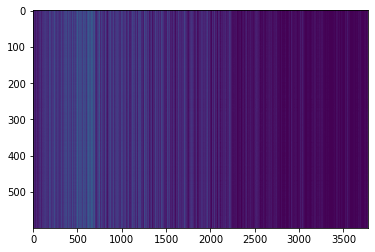

,AUC,pAUC
Source_0,0.736300,0.648421
Source_1,0.748900,0.636842
Source_2,0.827700,0.719474
Target_0,0.642100,0.657895
Target_1,0.779700,0.646316
Target_2,0.680900,0.537895
mean,0.735933,0.641140
h_mean,0.730800,0.636356


2021-05-31 23:30:22,425 - pytorch_modeler.py - INFO - epoch:74/100, train_losses:497.459256, val_AUC_hmean:0.730800, val_pAUC_hmean:0.636356, best_flag:True
2021-05-31 23:30:22,426 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.18it/s]
2021-05-31 23:30:23,170 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 86.02it/s]
2021-05-31 23:30:23,213 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 84.80it/s]
2021-05-31 23:30:23,258 - pytorch_modeler.py - INFO - epoch:75/100, train_losses:493.783760, val_AUC_hmean:0.717050, val_pAUC_hmean:0.617937, best_flag:False
2021-05-31 23:30:23,259 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.47it/s]
2021-05-31 23:30:23,989 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 83.82it/s]
2021-05-31 23:30:24,031 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 85.12it/s]
2021-05-31 23:30:

100%|██████████| 2/2 [00:00<00:00, 73.66it/s]
2021-05-31 23:30:36,959 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 65.69it/s]
2021-05-31 23:30:37,024 - pytorch_modeler.py - INFO - epoch:91/100, train_losses:437.323975, val_AUC_hmean:0.730868, val_pAUC_hmean:0.627554, best_flag:False
2021-05-31 23:30:37,026 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 13.87it/s]
2021-05-31 23:30:37,892 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 71.75it/s]
2021-05-31 23:30:37,943 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 72.91it/s]
2021-05-31 23:30:37,996 - pytorch_modeler.py - INFO - epoch:92/100, train_losses:435.876874, val_AUC_hmean:0.734670, val_pAUC_hmean:0.626844, best_flag:False
2021-05-31 23:30:38,000 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 15.33it/s]
2021-05-31 23:30:38,786 - pytorch_modeler.py - INFO - valid_source
100%|██████████|

,AUC,pAUC
Source_0,0.736300,0.648421
Source_1,0.748900,0.636842
Source_2,0.827700,0.719474
Target_0,0.642100,0.657895
Target_1,0.779700,0.646316
Target_2,0.680900,0.537895
mean,0.735933,0.641140
h_mean,0.730800,0.636356


2021-05-31 23:30:45,903 - 00_train.py - INFO - TARGET MACHINE_TYPE: ToyTrain
2021-05-31 23:30:45,904 - 00_train.py - INFO - MAKE DATA_LOADER
2021-05-31 23:30:45,906 - 00_train.py - INFO - TRAINING


elapsed time: 119.430499315 [sec]


2021-05-31 23:30:46,458 - pytorch_modeler.py - INFO - train
  0%|          | 0/12 [00:00<?, ?it/s]

use: cuda:0


100%|██████████| 12/12 [00:00<00:00, 14.78it/s]
2021-05-31 23:30:47,272 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 73.92it/s]
2021-05-31 23:30:47,326 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 77.32it/s]


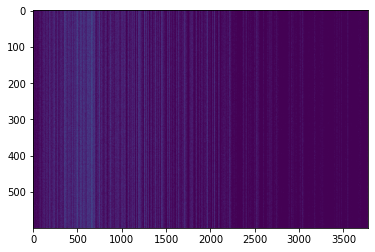

,AUC,pAUC
Source_0,0.527500,0.539474
Source_1,0.569500,0.533158
Source_2,0.626400,0.536316
Target_0,0.485800,0.544211
Target_1,0.663400,0.598421
Target_2,0.508600,0.491053
mean,0.563533,0.540439
h_mean,0.556580,0.538654


2021-05-31 23:30:49,546 - pytorch_modeler.py - INFO - epoch:1/100, train_losses:2547.667175, val_AUC_hmean:0.556580, val_pAUC_hmean:0.538654, best_flag:True
2021-05-31 23:30:49,547 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00, 11.90it/s]
2021-05-31 23:30:50,558 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 44.61it/s]
2021-05-31 23:30:50,624 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 45.88it/s]


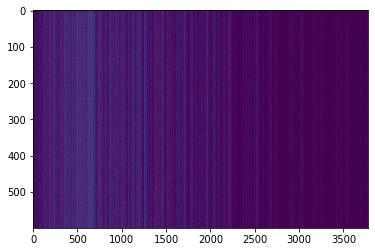

,AUC,pAUC
Source_0,0.552700,0.547368
Source_1,0.582400,0.538947
Source_2,0.651100,0.550000
Target_0,0.528800,0.586842
Target_1,0.674500,0.571579
Target_2,0.629400,0.509474
mean,0.603150,0.550702
h_mean,0.598524,0.549604


2021-05-31 23:30:53,082 - pytorch_modeler.py - INFO - epoch:2/100, train_losses:1579.110809, val_AUC_hmean:0.598524, val_pAUC_hmean:0.549604, best_flag:True
2021-05-31 23:30:53,083 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00, 10.01it/s]
2021-05-31 23:30:54,285 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 69.85it/s]
2021-05-31 23:30:54,336 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 68.52it/s]


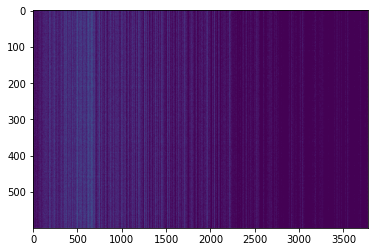

,AUC,pAUC
Source_0,0.561500,0.562632
Source_1,0.620700,0.562632
Source_2,0.650900,0.548947
Target_0,0.537100,0.601579
Target_1,0.688000,0.564211
Target_2,0.610200,0.513158
mean,0.611400,0.558860
h_mean,0.607133,0.557632


2021-05-31 23:30:56,784 - pytorch_modeler.py - INFO - epoch:3/100, train_losses:1221.645630, val_AUC_hmean:0.607133, val_pAUC_hmean:0.557632, best_flag:True
2021-05-31 23:30:56,785 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 14.79it/s]
2021-05-31 23:30:57,601 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 63.13it/s]
2021-05-31 23:30:57,654 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 73.82it/s]


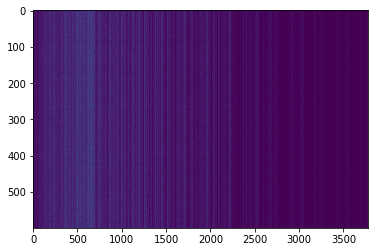

,AUC,pAUC
Source_0,0.572800,0.570000
Source_1,0.627100,0.548421
Source_2,0.750100,0.619474
Target_0,0.545800,0.605789
Target_1,0.681700,0.558947
Target_2,0.645200,0.514737
mean,0.637117,0.569561
h_mean,0.630079,0.567396


2021-05-31 23:31:00,045 - pytorch_modeler.py - INFO - epoch:4/100, train_losses:1073.398931, val_AUC_hmean:0.630079, val_pAUC_hmean:0.567396, best_flag:True
2021-05-31 23:31:00,046 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 15.65it/s]
2021-05-31 23:31:00,815 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 74.70it/s]
2021-05-31 23:31:00,864 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 75.06it/s]


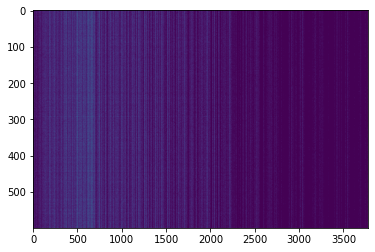

,AUC,pAUC
Source_0,0.569600,0.591053
Source_1,0.638200,0.546842
Source_2,0.786400,0.612105
Target_0,0.542900,0.615263
Target_1,0.672500,0.578421
Target_2,0.677600,0.512632
mean,0.647867,0.576053
h_mean,0.638373,0.573659


2021-05-31 23:31:03,092 - pytorch_modeler.py - INFO - epoch:5/100, train_losses:1002.240850, val_AUC_hmean:0.638373, val_pAUC_hmean:0.573659, best_flag:True
2021-05-31 23:31:03,093 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 14.13it/s]
2021-05-31 23:31:03,945 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 65.72it/s]
2021-05-31 23:31:03,998 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 70.02it/s]


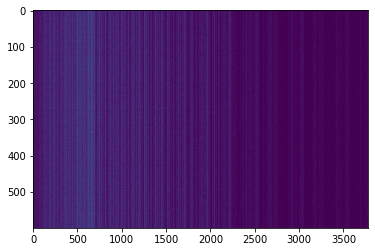

,AUC,pAUC
Source_0,0.584900,0.593684
Source_1,0.635600,0.526842
Source_2,0.789500,0.672105
Target_0,0.544000,0.615263
Target_1,0.670500,0.572632
Target_2,0.641800,0.505789
mean,0.644383,0.581053
h_mean,0.635767,0.575865


2021-05-31 23:31:06,330 - pytorch_modeler.py - INFO - epoch:6/100, train_losses:963.505646, val_AUC_hmean:0.635767, val_pAUC_hmean:0.575865, best_flag:True
2021-05-31 23:31:06,331 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.07it/s]
2021-05-31 23:31:07,079 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 74.98it/s]
2021-05-31 23:31:07,126 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 78.92it/s]


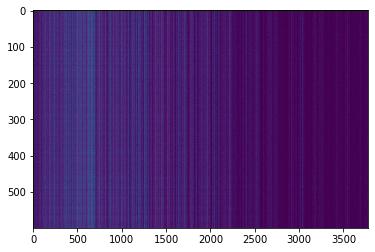

,AUC,pAUC
Source_0,0.579100,0.590526
Source_1,0.678500,0.587895
Source_2,0.809400,0.635789
Target_0,0.539800,0.624211
Target_1,0.689000,0.587895
Target_2,0.623300,0.499474
mean,0.653183,0.587632
h_mean,0.642094,0.584092


2021-05-31 23:31:09,357 - pytorch_modeler.py - INFO - epoch:7/100, train_losses:938.167384, val_AUC_hmean:0.642094, val_pAUC_hmean:0.584092, best_flag:True
2021-05-31 23:31:09,358 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 15.03it/s]
2021-05-31 23:31:10,159 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 68.49it/s]
2021-05-31 23:31:10,211 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 75.10it/s]


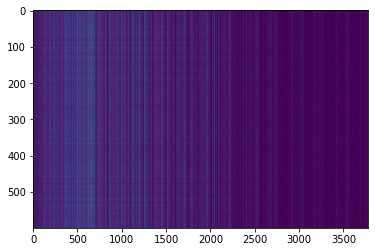

,AUC,pAUC
Source_0,0.602500,0.594737
Source_1,0.690200,0.578947
Source_2,0.810100,0.653158
Target_0,0.553300,0.636842
Target_1,0.691800,0.585789
Target_2,0.649300,0.503158
mean,0.666200,0.592105
h_mean,0.656744,0.587976


2021-05-31 23:31:12,488 - pytorch_modeler.py - INFO - epoch:8/100, train_losses:913.839371, val_AUC_hmean:0.656744, val_pAUC_hmean:0.587976, best_flag:True
2021-05-31 23:31:12,489 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  9.17it/s]
2021-05-31 23:31:13,800 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 39.62it/s]
2021-05-31 23:31:13,871 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 37.04it/s]


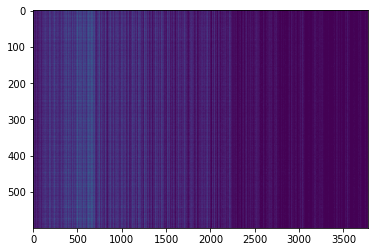

,AUC,pAUC
Source_0,0.616000,0.605263
Source_1,0.708500,0.617895
Source_2,0.807500,0.679474
Target_0,0.568000,0.631053
Target_1,0.723800,0.595789
Target_2,0.642400,0.507895
mean,0.677700,0.606228
h_mean,0.668746,0.601545


2021-05-31 23:31:16,395 - pytorch_modeler.py - INFO - epoch:9/100, train_losses:895.239777, val_AUC_hmean:0.668746, val_pAUC_hmean:0.601545, best_flag:True
2021-05-31 23:31:16,396 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 14.57it/s]
2021-05-31 23:31:17,222 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 41.34it/s]
2021-05-31 23:31:17,293 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 45.98it/s]
2021-05-31 23:31:17,360 - pytorch_modeler.py - INFO - epoch:10/100, train_losses:879.480479, val_AUC_hmean:0.655501, val_pAUC_hmean:0.595895, best_flag:False
2021-05-31 23:31:17,361 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  8.48it/s]
2021-05-31 23:31:18,778 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 53.80it/s]
2021-05-31 23:31:18,841 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 51.34it/s]


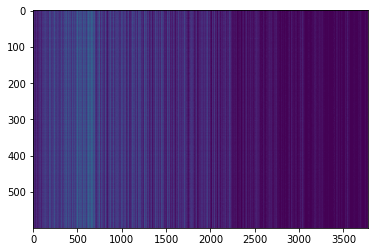

,AUC,pAUC
Source_0,0.626700,0.610526
Source_1,0.709400,0.600526
Source_2,0.802300,0.693684
Target_0,0.587900,0.642105
Target_1,0.730900,0.603158
Target_2,0.647300,0.509474
mean,0.684083,0.609912
h_mean,0.676762,0.604665


2021-05-31 23:31:21,187 - pytorch_modeler.py - INFO - epoch:11/100, train_losses:872.278926, val_AUC_hmean:0.676762, val_pAUC_hmean:0.604665, best_flag:True
2021-05-31 23:31:21,188 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00, 11.91it/s]
2021-05-31 23:31:22,197 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 38.49it/s]
2021-05-31 23:31:22,270 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 38.62it/s]


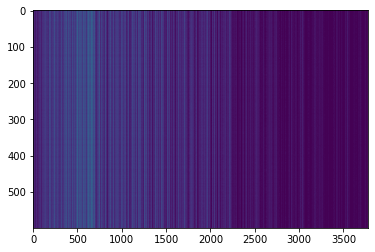

,AUC,pAUC
Source_0,0.627900,0.624737
Source_1,0.731100,0.635263
Source_2,0.811900,0.703158
Target_0,0.575400,0.640000
Target_1,0.733900,0.606842
Target_2,0.644300,0.512632
mean,0.687417,0.620439
h_mean,0.678375,0.614875


2021-05-31 23:31:24,652 - pytorch_modeler.py - INFO - epoch:12/100, train_losses:855.136765, val_AUC_hmean:0.678375, val_pAUC_hmean:0.614875, best_flag:True
2021-05-31 23:31:24,653 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  9.40it/s]
2021-05-31 23:31:25,932 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 56.32it/s]
2021-05-31 23:31:25,985 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 62.16it/s]
2021-05-31 23:31:26,039 - pytorch_modeler.py - INFO - epoch:13/100, train_losses:850.519674, val_AUC_hmean:0.687263, val_pAUC_hmean:0.610520, best_flag:False
2021-05-31 23:31:26,040 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00, 11.40it/s]
2021-05-31 23:31:27,094 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 68.92it/s]
2021-05-31 23:31:27,146 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 77.97it/s]
2021-05-31 23:31:

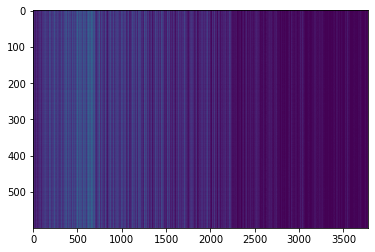

,AUC,pAUC
Source_0,0.654000,0.632632
Source_1,0.718600,0.614737
Source_2,0.829900,0.724737
Target_0,0.588000,0.639474
Target_1,0.727400,0.598421
Target_2,0.663200,0.521053
mean,0.696850,0.621842
h_mean,0.688951,0.615936


2021-05-31 23:31:31,375 - pytorch_modeler.py - INFO - epoch:16/100, train_losses:816.519496, val_AUC_hmean:0.688951, val_pAUC_hmean:0.615936, best_flag:True
2021-05-31 23:31:31,375 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  9.37it/s]
2021-05-31 23:31:32,658 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 66.90it/s]
2021-05-31 23:31:32,708 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 59.38it/s]
2021-05-31 23:31:32,773 - pytorch_modeler.py - INFO - epoch:17/100, train_losses:808.269801, val_AUC_hmean:0.677837, val_pAUC_hmean:0.607091, best_flag:False
2021-05-31 23:31:32,774 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  9.26it/s]
2021-05-31 23:31:34,072 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 36.94it/s]
2021-05-31 23:31:34,145 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 40.02it/s]


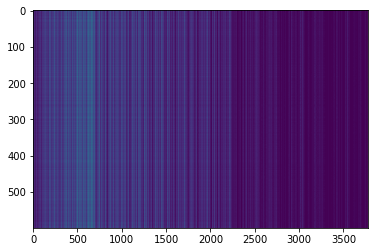

,AUC,pAUC
Source_0,0.665200,0.635263
Source_1,0.732600,0.650000
Source_2,0.810200,0.721579
Target_0,0.606000,0.648421
Target_1,0.744300,0.617895
Target_2,0.663900,0.520526
mean,0.703700,0.632281
h_mean,0.697469,0.626292


2021-05-31 23:31:36,216 - pytorch_modeler.py - INFO - epoch:18/100, train_losses:801.611959, val_AUC_hmean:0.697469, val_pAUC_hmean:0.626292, best_flag:True
2021-05-31 23:31:36,216 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 15.96it/s]
2021-05-31 23:31:36,970 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 77.19it/s]
2021-05-31 23:31:37,017 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 82.49it/s]
2021-05-31 23:31:37,065 - pytorch_modeler.py - INFO - epoch:19/100, train_losses:792.440623, val_AUC_hmean:0.687891, val_pAUC_hmean:0.611745, best_flag:False
2021-05-31 23:31:37,066 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.23it/s]
2021-05-31 23:31:38,049 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 41.06it/s]
2021-05-31 23:31:38,117 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 48.00it/s]
2021-05-31 23:31:

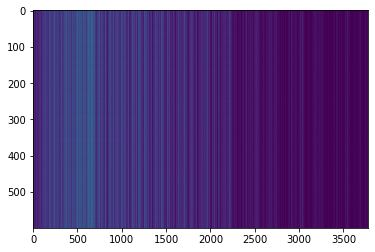

,AUC,pAUC
Source_0,0.679900,0.641053
Source_1,0.744200,0.651053
Source_2,0.817200,0.720000
Target_0,0.608300,0.651053
Target_1,0.783900,0.658947
Target_2,0.682700,0.525263
mean,0.719367,0.641228
h_mean,0.712370,0.635448


2021-05-31 23:31:45,789 - pytorch_modeler.py - INFO - epoch:24/100, train_losses:759.688507, val_AUC_hmean:0.712370, val_pAUC_hmean:0.635448, best_flag:True
2021-05-31 23:31:45,790 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  9.29it/s]
2021-05-31 23:31:47,083 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 46.32it/s]
2021-05-31 23:31:47,145 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 49.51it/s]
2021-05-31 23:31:47,206 - pytorch_modeler.py - INFO - epoch:25/100, train_losses:755.223551, val_AUC_hmean:0.691186, val_pAUC_hmean:0.616317, best_flag:False
2021-05-31 23:31:47,207 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  9.39it/s]
2021-05-31 23:31:48,488 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 68.79it/s]
2021-05-31 23:31:48,537 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 65.74it/s]
2021-05-31 23:31:

100%|██████████| 2/2 [00:00<00:00, 60.10it/s]
2021-05-31 23:32:08,535 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 55.10it/s]
2021-05-31 23:32:08,593 - pytorch_modeler.py - INFO - epoch:41/100, train_losses:667.764389, val_AUC_hmean:0.712301, val_pAUC_hmean:0.618897, best_flag:False
2021-05-31 23:32:08,594 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  9.38it/s]
2021-05-31 23:32:09,875 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 52.40it/s]
2021-05-31 23:32:09,931 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 69.17it/s]
2021-05-31 23:32:09,986 - pytorch_modeler.py - INFO - epoch:42/100, train_losses:662.212540, val_AUC_hmean:0.718309, val_pAUC_hmean:0.622943, best_flag:False
2021-05-31 23:32:09,987 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  9.47it/s]
2021-05-31 23:32:11,257 - pytorch_modeler.py - INFO - valid_source
100%|██████████|

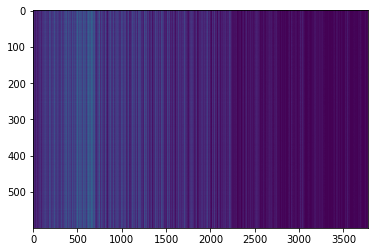

,AUC,pAUC
Source_0,0.744700,0.637895
Source_1,0.754000,0.650526
Source_2,0.823700,0.714211
Target_0,0.640600,0.650000
Target_1,0.790900,0.672105
Target_2,0.677600,0.530526
mean,0.738583,0.642544
h_mean,0.733108,0.637195


2021-05-31 23:32:20,264 - pytorch_modeler.py - INFO - epoch:48/100, train_losses:638.206029, val_AUC_hmean:0.733108, val_pAUC_hmean:0.637195, best_flag:True
2021-05-31 23:32:20,265 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.66it/s]
2021-05-31 23:32:21,215 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 78.65it/s]
2021-05-31 23:32:21,260 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 84.00it/s]
2021-05-31 23:32:21,305 - pytorch_modeler.py - INFO - epoch:49/100, train_losses:630.684764, val_AUC_hmean:0.734337, val_pAUC_hmean:0.632961, best_flag:False
2021-05-31 23:32:21,306 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.21it/s]
2021-05-31 23:32:22,048 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 82.49it/s]
2021-05-31 23:32:22,092 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 85.31it/s]
2021-05-31 23:32:

100%|██████████| 2/2 [00:00<00:00, 50.99it/s]
2021-05-31 23:32:43,763 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 53.04it/s]
2021-05-31 23:32:43,826 - pytorch_modeler.py - INFO - epoch:65/100, train_losses:561.586868, val_AUC_hmean:0.722408, val_pAUC_hmean:0.628502, best_flag:False
2021-05-31 23:32:43,827 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  8.94it/s]
2021-05-31 23:32:45,171 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 58.94it/s]
2021-05-31 23:32:45,226 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 58.54it/s]
2021-05-31 23:32:45,285 - pytorch_modeler.py - INFO - epoch:66/100, train_losses:558.063588, val_AUC_hmean:0.735231, val_pAUC_hmean:0.623029, best_flag:False
2021-05-31 23:32:45,287 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  9.40it/s]
2021-05-31 23:32:46,566 - pytorch_modeler.py - INFO - valid_source
100%|██████████|

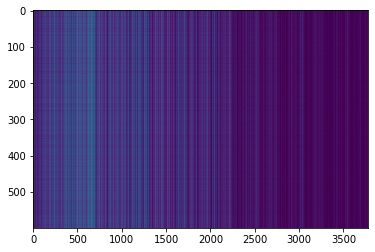

,AUC,pAUC
Source_0,0.762500,0.641579
Source_1,0.760600,0.655263
Source_2,0.834400,0.715263
Target_0,0.637400,0.647895
Target_1,0.793600,0.681579
Target_2,0.663100,0.530000
mean,0.741933,0.645263
h_mean,0.735140,0.639640


2021-05-31 23:33:03,600 - pytorch_modeler.py - INFO - epoch:80/100, train_losses:505.135376, val_AUC_hmean:0.735140, val_pAUC_hmean:0.639640, best_flag:True
2021-05-31 23:33:03,601 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  9.63it/s]
2021-05-31 23:33:04,849 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 54.28it/s]
2021-05-31 23:33:04,911 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 62.16it/s]
2021-05-31 23:33:04,969 - pytorch_modeler.py - INFO - epoch:81/100, train_losses:501.475263, val_AUC_hmean:0.724398, val_pAUC_hmean:0.627855, best_flag:False
2021-05-31 23:33:04,970 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 14.54it/s]
2021-05-31 23:33:05,797 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 75.50it/s]
2021-05-31 23:33:05,855 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 77.61it/s]
2021-05-31 23:33:

100%|██████████| 2/2 [00:00<00:00, 80.33it/s]
2021-05-31 23:33:22,930 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 77.43it/s]
2021-05-31 23:33:22,978 - pytorch_modeler.py - INFO - epoch:97/100, train_losses:444.655546, val_AUC_hmean:0.730449, val_pAUC_hmean:0.619169, best_flag:False
2021-05-31 23:33:22,979 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  9.80it/s]
2021-05-31 23:33:24,206 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 65.71it/s]
2021-05-31 23:33:24,262 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 59.39it/s]
2021-05-31 23:33:24,323 - pytorch_modeler.py - INFO - epoch:98/100, train_losses:441.128718, val_AUC_hmean:0.737386, val_pAUC_hmean:0.621682, best_flag:False
2021-05-31 23:33:24,325 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  9.12it/s]
2021-05-31 23:33:25,644 - pytorch_modeler.py - INFO - valid_source
100%|██████████|

,AUC,pAUC
Source_0,0.762500,0.641579
Source_1,0.760600,0.655263
Source_2,0.834400,0.715263
Target_0,0.637400,0.647895
Target_1,0.793600,0.681579
Target_2,0.663100,0.530000
mean,0.741933,0.645263
h_mean,0.735140,0.639640


2021-05-31 23:33:27,282 - 00_train.py - INFO - TARGET MACHINE_TYPE: pump
2021-05-31 23:33:27,283 - 00_train.py - INFO - MAKE DATA_LOADER
2021-05-31 23:33:27,287 - 00_train.py - INFO - TRAINING


elapsed time: 161.378247738 [sec]


2021-05-31 23:33:27,897 - pytorch_modeler.py - INFO - train
  0%|          | 0/12 [00:00<?, ?it/s]

use: cuda:0


100%|██████████| 12/12 [00:01<00:00,  9.07it/s]
2021-05-31 23:33:29,222 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 43.98it/s]
2021-05-31 23:33:29,295 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 49.86it/s]


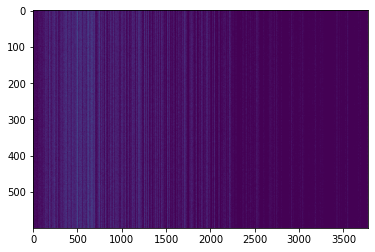

,AUC,pAUC
Source_0,0.523200,0.540000
Source_1,0.605200,0.542105
Source_2,0.610700,0.562632
Target_0,0.483500,0.544737
Target_1,0.691100,0.600526
Target_2,0.534300,0.495263
mean,0.574667,0.547544
h_mean,0.566682,0.545754


2021-05-31 23:33:31,807 - pytorch_modeler.py - INFO - epoch:1/100, train_losses:2562.583730, val_AUC_hmean:0.566682, val_pAUC_hmean:0.545754, best_flag:True
2021-05-31 23:33:31,808 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00, 11.94it/s]
2021-05-31 23:33:32,815 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 40.93it/s]
2021-05-31 23:33:32,882 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 36.55it/s]


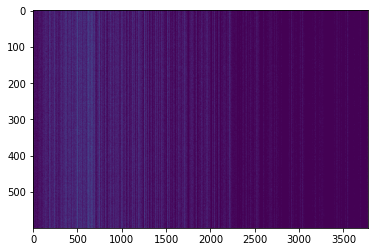

,AUC,pAUC
Source_0,0.550900,0.538421
Source_1,0.585200,0.518947
Source_2,0.662300,0.591053
Target_0,0.534500,0.572632
Target_1,0.665500,0.569474
Target_2,0.636500,0.511579
mean,0.605817,0.550351
h_mean,0.601290,0.548786


2021-05-31 23:33:35,236 - pytorch_modeler.py - INFO - epoch:2/100, train_losses:1584.938904, val_AUC_hmean:0.601290, val_pAUC_hmean:0.548786, best_flag:True
2021-05-31 23:33:35,238 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  9.01it/s]
2021-05-31 23:33:36,573 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 50.86it/s]
2021-05-31 23:33:36,640 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 40.48it/s]


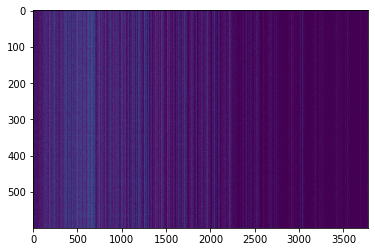

,AUC,pAUC
Source_0,0.554100,0.548947
Source_1,0.643100,0.568947
Source_2,0.662500,0.568947
Target_0,0.538100,0.586316
Target_1,0.680100,0.568421
Target_2,0.632000,0.520000
mean,0.618317,0.560263
h_mean,0.613486,0.559449


2021-05-31 23:33:39,130 - pytorch_modeler.py - INFO - epoch:3/100, train_losses:1231.737315, val_AUC_hmean:0.613486, val_pAUC_hmean:0.559449, best_flag:True
2021-05-31 23:33:39,131 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  9.20it/s]
2021-05-31 23:33:40,437 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 45.82it/s]
2021-05-31 23:33:40,500 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 53.13it/s]


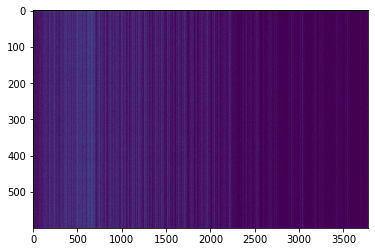

,AUC,pAUC
Source_0,0.557300,0.557368
Source_1,0.629500,0.550526
Source_2,0.748400,0.602632
Target_0,0.537600,0.606316
Target_1,0.670900,0.562632
Target_2,0.669300,0.514737
mean,0.635500,0.565702
h_mean,0.627361,0.563942


2021-05-31 23:33:42,826 - pytorch_modeler.py - INFO - epoch:4/100, train_losses:1089.486898, val_AUC_hmean:0.627361, val_pAUC_hmean:0.563942, best_flag:True
2021-05-31 23:33:42,827 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  9.26it/s]
2021-05-31 23:33:44,125 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 41.44it/s]
2021-05-31 23:33:44,199 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 36.25it/s]


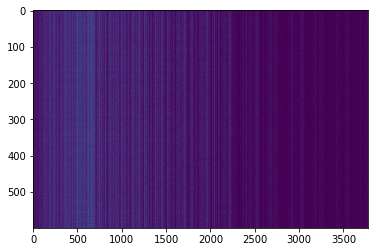

,AUC,pAUC
Source_0,0.552500,0.581053
Source_1,0.654100,0.546316
Source_2,0.758200,0.601053
Target_0,0.527900,0.619474
Target_1,0.677200,0.574737
Target_2,0.676600,0.528421
mean,0.641083,0.575175
h_mean,0.631138,0.573513


2021-05-31 23:33:46,557 - pytorch_modeler.py - INFO - epoch:5/100, train_losses:1023.633209, val_AUC_hmean:0.631138, val_pAUC_hmean:0.573513, best_flag:True
2021-05-31 23:33:46,559 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  9.20it/s]
2021-05-31 23:33:47,865 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 42.26it/s]
2021-05-31 23:33:47,942 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 37.73it/s]


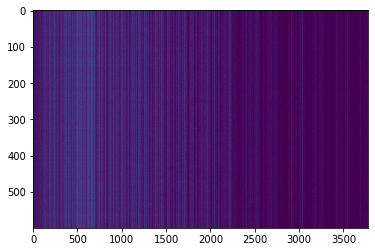

,AUC,pAUC
Source_0,0.569500,0.589474
Source_1,0.651200,0.563158
Source_2,0.789400,0.685263
Target_0,0.532200,0.625263
Target_1,0.693800,0.584737
Target_2,0.616800,0.510526
mean,0.642150,0.593070
h_mean,0.631583,0.588254


2021-05-31 23:33:50,568 - pytorch_modeler.py - INFO - epoch:6/100, train_losses:979.884430, val_AUC_hmean:0.631583, val_pAUC_hmean:0.588254, best_flag:True
2021-05-31 23:33:50,569 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00, 10.39it/s]
2021-05-31 23:33:51,726 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 40.66it/s]
2021-05-31 23:33:51,797 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 53.70it/s]


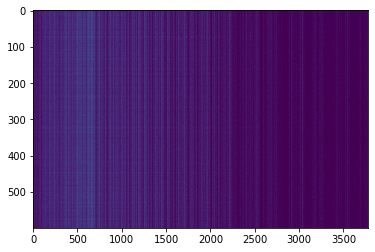

,AUC,pAUC
Source_0,0.582000,0.586316
Source_1,0.672900,0.563158
Source_2,0.819700,0.704737
Target_0,0.543200,0.629474
Target_1,0.693000,0.585263
Target_2,0.668800,0.511053
mean,0.663267,0.596667
h_mean,0.651930,0.590886


2021-05-31 23:33:54,178 - pytorch_modeler.py - INFO - epoch:7/100, train_losses:952.939356, val_AUC_hmean:0.651930, val_pAUC_hmean:0.590886, best_flag:True
2021-05-31 23:33:54,180 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00, 10.01it/s]
2021-05-31 23:33:55,380 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 45.15it/s]
2021-05-31 23:33:55,446 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 59.35it/s]


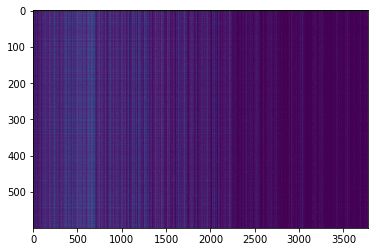

,AUC,pAUC
Source_0,0.591400,0.588947
Source_1,0.675200,0.561579
Source_2,0.821100,0.689474
Target_0,0.541000,0.625789
Target_1,0.690700,0.584737
Target_2,0.672000,0.526316
mean,0.665233,0.596140
h_mean,0.654011,0.591881


2021-05-31 23:33:57,705 - pytorch_modeler.py - INFO - epoch:8/100, train_losses:929.851354, val_AUC_hmean:0.654011, val_pAUC_hmean:0.591881, best_flag:True
2021-05-31 23:33:57,705 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  9.40it/s]
2021-05-31 23:33:58,984 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 44.55it/s]
2021-05-31 23:33:59,050 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 52.38it/s]


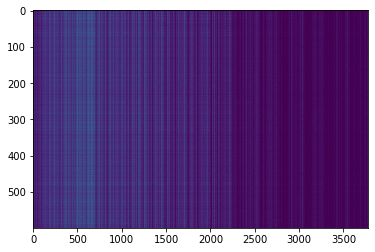

,AUC,pAUC
Source_0,0.606800,0.593158
Source_1,0.710300,0.593684
Source_2,0.826600,0.675789
Target_0,0.557000,0.633684
Target_1,0.695900,0.590526
Target_2,0.662200,0.518421
mean,0.676467,0.600877
h_mean,0.666070,0.596988


2021-05-31 23:34:01,463 - pytorch_modeler.py - INFO - epoch:9/100, train_losses:910.273997, val_AUC_hmean:0.666070, val_pAUC_hmean:0.596988, best_flag:True
2021-05-31 23:34:01,464 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  9.21it/s]
2021-05-31 23:34:02,769 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 38.66it/s]
2021-05-31 23:34:02,847 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 44.12it/s]


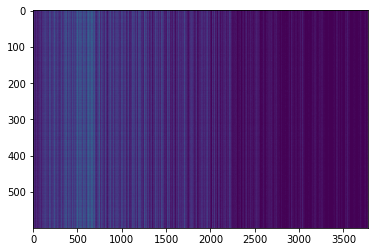

,AUC,pAUC
Source_0,0.598600,0.590526
Source_1,0.715200,0.595789
Source_2,0.831900,0.684737
Target_0,0.551400,0.623684
Target_1,0.721900,0.595263
Target_2,0.633300,0.522105
mean,0.675383,0.602018
h_mean,0.663081,0.598152


2021-05-31 23:34:05,194 - pytorch_modeler.py - INFO - epoch:10/100, train_losses:894.605662, val_AUC_hmean:0.663081, val_pAUC_hmean:0.598152, best_flag:True
2021-05-31 23:34:05,195 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  9.80it/s]
2021-05-31 23:34:06,422 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 70.45it/s]
2021-05-31 23:34:06,481 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 46.78it/s]


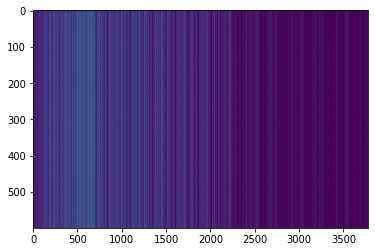

,AUC,pAUC
Source_0,0.605700,0.603684
Source_1,0.701500,0.600526
Source_2,0.825900,0.702632
Target_0,0.561200,0.645263
Target_1,0.717300,0.595263
Target_2,0.621400,0.502105
mean,0.672167,0.608246
h_mean,0.661333,0.602034


2021-05-31 23:34:08,635 - pytorch_modeler.py - INFO - epoch:11/100, train_losses:880.082718, val_AUC_hmean:0.661333, val_pAUC_hmean:0.602034, best_flag:True
2021-05-31 23:34:08,636 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  9.16it/s]
2021-05-31 23:34:09,949 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 47.47it/s]
2021-05-31 23:34:10,012 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 45.53it/s]


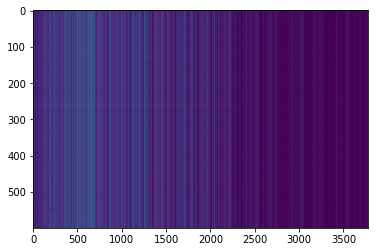

,AUC,pAUC
Source_0,0.609400,0.596316
Source_1,0.701400,0.584737
Source_2,0.840800,0.717895
Target_0,0.561200,0.640526
Target_1,0.724600,0.596842
Target_2,0.658600,0.530000
mean,0.682667,0.611053
h_mean,0.671414,0.605841


2021-05-31 23:34:12,146 - pytorch_modeler.py - INFO - epoch:12/100, train_losses:867.481730, val_AUC_hmean:0.671414, val_pAUC_hmean:0.605841, best_flag:True
2021-05-31 23:34:12,147 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  8.83it/s]
2021-05-31 23:34:13,508 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 39.82it/s]
2021-05-31 23:34:13,584 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 41.15it/s]


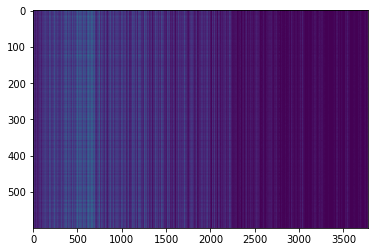

,AUC,pAUC
Source_0,0.615900,0.605263
Source_1,0.735500,0.629474
Source_2,0.822600,0.710000
Target_0,0.568500,0.642632
Target_1,0.740200,0.603684
Target_2,0.645000,0.512105
mean,0.687950,0.617193
h_mean,0.677254,0.611336


2021-05-31 23:34:15,688 - pytorch_modeler.py - INFO - epoch:13/100, train_losses:857.963359, val_AUC_hmean:0.677254, val_pAUC_hmean:0.611336, best_flag:True
2021-05-31 23:34:15,689 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00, 10.56it/s]
2021-05-31 23:34:16,827 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 84.12it/s]
2021-05-31 23:34:16,869 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 83.61it/s]
2021-05-31 23:34:16,915 - pytorch_modeler.py - INFO - epoch:14/100, train_losses:845.602620, val_AUC_hmean:0.676923, val_pAUC_hmean:0.603548, best_flag:False
2021-05-31 23:34:16,916 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.09it/s]
2021-05-31 23:34:17,664 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 69.44it/s]
2021-05-31 23:34:17,722 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 80.12it/s]
2021-05-31 23:34:

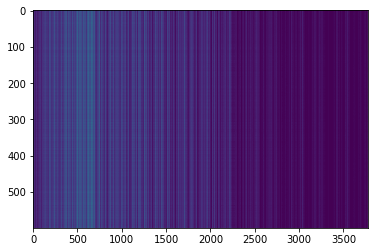

,AUC,pAUC
Source_0,0.660300,0.630000
Source_1,0.757300,0.656842
Source_2,0.823600,0.708947
Target_0,0.590800,0.649474
Target_1,0.760300,0.630000
Target_2,0.649300,0.517895
mean,0.706933,0.632193
h_mean,0.697907,0.626424


2021-05-31 23:34:26,598 - pytorch_modeler.py - INFO - epoch:20/100, train_losses:801.482269, val_AUC_hmean:0.697907, val_pAUC_hmean:0.626424, best_flag:True
2021-05-31 23:34:26,599 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  9.35it/s]
2021-05-31 23:34:27,884 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 38.23it/s]
2021-05-31 23:34:27,956 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 41.02it/s]
2021-05-31 23:34:28,028 - pytorch_modeler.py - INFO - epoch:21/100, train_losses:792.087011, val_AUC_hmean:0.694072, val_pAUC_hmean:0.623187, best_flag:False
2021-05-31 23:34:28,029 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  9.39it/s]
2021-05-31 23:34:29,309 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 47.37it/s]
2021-05-31 23:34:29,370 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 47.31it/s]
2021-05-31 23:34:

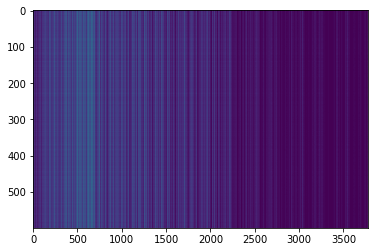

,AUC,pAUC
Source_0,0.688000,0.626316
Source_1,0.745300,0.633684
Source_2,0.839500,0.720000
Target_0,0.611700,0.653684
Target_1,0.766600,0.632632
Target_2,0.656300,0.525789
mean,0.717900,0.632018
h_mean,0.710113,0.626567


2021-05-31 23:34:44,352 - pytorch_modeler.py - INFO - epoch:31/100, train_losses:735.178131, val_AUC_hmean:0.710113, val_pAUC_hmean:0.626567, best_flag:True
2021-05-31 23:34:44,353 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00, 10.21it/s]
2021-05-31 23:34:45,530 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 81.93it/s]
2021-05-31 23:34:45,576 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 77.97it/s]


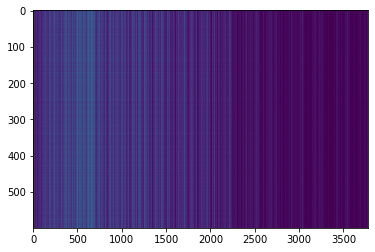

,AUC,pAUC
Source_0,0.696500,0.643158
Source_1,0.749800,0.629474
Source_2,0.829200,0.715263
Target_0,0.605100,0.653684
Target_1,0.775100,0.635263
Target_2,0.644900,0.523684
mean,0.716767,0.633421
h_mean,0.708481,0.627941


2021-05-31 23:34:48,236 - pytorch_modeler.py - INFO - epoch:32/100, train_losses:726.741608, val_AUC_hmean:0.708481, val_pAUC_hmean:0.627941, best_flag:True
2021-05-31 23:34:48,237 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  9.89it/s]
2021-05-31 23:34:49,454 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 39.64it/s]
2021-05-31 23:34:49,527 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 52.44it/s]
2021-05-31 23:34:49,593 - pytorch_modeler.py - INFO - epoch:33/100, train_losses:721.610677, val_AUC_hmean:0.690752, val_pAUC_hmean:0.613718, best_flag:False
2021-05-31 23:34:49,593 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 15.06it/s]
2021-05-31 23:34:50,392 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 83.03it/s]
2021-05-31 23:34:50,435 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 76.47it/s]
2021-05-31 23:34:

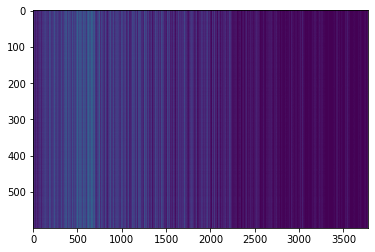

,AUC,pAUC
Source_0,0.696000,0.632105
Source_1,0.758400,0.646842
Source_2,0.835200,0.718421
Target_0,0.605600,0.648947
Target_1,0.772200,0.636842
Target_2,0.654600,0.526316
mean,0.720333,0.634912
h_mean,0.712033,0.629516


2021-05-31 23:34:56,121 - pytorch_modeler.py - INFO - epoch:37/100, train_losses:700.315954, val_AUC_hmean:0.712033, val_pAUC_hmean:0.629516, best_flag:True
2021-05-31 23:34:56,122 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00, 10.77it/s]
2021-05-31 23:34:57,239 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 45.43it/s]
2021-05-31 23:34:57,304 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 57.47it/s]
2021-05-31 23:34:57,361 - pytorch_modeler.py - INFO - epoch:38/100, train_losses:696.298894, val_AUC_hmean:0.708017, val_pAUC_hmean:0.618879, best_flag:False
2021-05-31 23:34:57,362 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.59it/s]
2021-05-31 23:34:58,317 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 84.34it/s]
2021-05-31 23:34:58,360 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 76.46it/s]
2021-05-31 23:34:

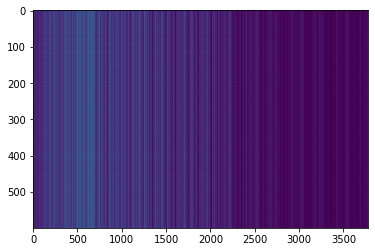

,AUC,pAUC
Source_0,0.695700,0.626842
Source_1,0.750600,0.641579
Source_2,0.835700,0.710000
Target_0,0.602600,0.660000
Target_1,0.796600,0.671053
Target_2,0.664100,0.524737
mean,0.724217,0.639035
h_mean,0.715403,0.633348


2021-05-31 23:35:01,986 - pytorch_modeler.py - INFO - epoch:40/100, train_losses:685.380575, val_AUC_hmean:0.715403, val_pAUC_hmean:0.633348, best_flag:True
2021-05-31 23:35:01,987 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  9.96it/s]
2021-05-31 23:35:03,194 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 41.70it/s]
2021-05-31 23:35:03,263 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 62.92it/s]
2021-05-31 23:35:03,321 - pytorch_modeler.py - INFO - epoch:41/100, train_losses:680.963654, val_AUC_hmean:0.714853, val_pAUC_hmean:0.622731, best_flag:False
2021-05-31 23:35:03,322 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  9.51it/s]
2021-05-31 23:35:04,586 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 41.88it/s]
2021-05-31 23:35:04,656 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 46.90it/s]
2021-05-31 23:35:

100%|██████████| 2/2 [00:00<00:00, 74.42it/s]
2021-05-31 23:35:23,348 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 47.10it/s]
2021-05-31 23:35:23,416 - pytorch_modeler.py - INFO - epoch:57/100, train_losses:609.386368, val_AUC_hmean:0.707737, val_pAUC_hmean:0.614178, best_flag:False
2021-05-31 23:35:23,418 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  8.97it/s]
2021-05-31 23:35:24,757 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 58.68it/s]
2021-05-31 23:35:24,814 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 58.40it/s]
2021-05-31 23:35:24,878 - pytorch_modeler.py - INFO - epoch:58/100, train_losses:604.618612, val_AUC_hmean:0.709513, val_pAUC_hmean:0.622037, best_flag:False
2021-05-31 23:35:24,879 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00, 11.53it/s]
2021-05-31 23:35:25,923 - pytorch_modeler.py - INFO - valid_source
100%|██████████|

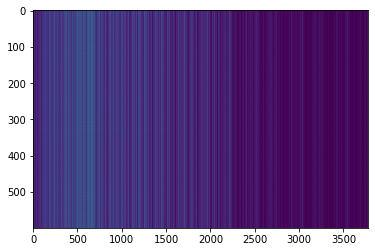

,AUC,pAUC
Source_0,0.752500,0.640526
Source_1,0.764700,0.654211
Source_2,0.826600,0.708947
Target_0,0.631500,0.662105
Target_1,0.793900,0.653684
Target_2,0.656400,0.520000
mean,0.737600,0.639912
h_mean,0.730551,0.634014


2021-05-31 23:35:31,873 - pytorch_modeler.py - INFO - epoch:62/100, train_losses:586.944926, val_AUC_hmean:0.730551, val_pAUC_hmean:0.634014, best_flag:True
2021-05-31 23:35:31,874 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  8.90it/s]
2021-05-31 23:35:33,228 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 41.42it/s]
2021-05-31 23:35:33,298 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 46.63it/s]
2021-05-31 23:35:33,366 - pytorch_modeler.py - INFO - epoch:63/100, train_losses:582.976893, val_AUC_hmean:0.730400, val_pAUC_hmean:0.631357, best_flag:False
2021-05-31 23:35:33,367 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  9.27it/s]
2021-05-31 23:35:34,664 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 70.92it/s]
2021-05-31 23:35:34,718 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 62.83it/s]
2021-05-31 23:35:

100%|██████████| 2/2 [00:00<00:00, 42.20it/s]
2021-05-31 23:35:54,325 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 44.28it/s]
2021-05-31 23:35:54,393 - pytorch_modeler.py - INFO - epoch:79/100, train_losses:521.266617, val_AUC_hmean:0.726296, val_pAUC_hmean:0.625055, best_flag:False
2021-05-31 23:35:54,394 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  9.20it/s]
2021-05-31 23:35:55,700 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 44.88it/s]
2021-05-31 23:35:55,763 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 49.00it/s]
2021-05-31 23:35:55,825 - pytorch_modeler.py - INFO - epoch:80/100, train_losses:518.176346, val_AUC_hmean:0.724271, val_pAUC_hmean:0.625095, best_flag:False
2021-05-31 23:35:55,826 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  9.48it/s]
2021-05-31 23:35:57,094 - pytorch_modeler.py - INFO - valid_source
100%|██████████|

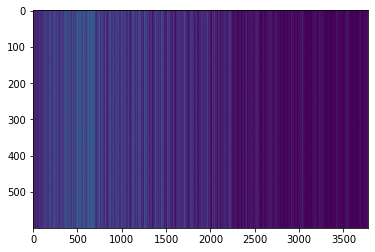

,AUC,pAUC
Source_0,0.739400,0.641053
Source_1,0.750400,0.634211
Source_2,0.824200,0.708421
Target_0,0.630900,0.655789
Target_1,0.795700,0.674737
Target_2,0.657000,0.524737
mean,0.732933,0.639825
h_mean,0.726196,0.634186


2021-05-31 23:36:06,305 - pytorch_modeler.py - INFO - epoch:86/100, train_losses:494.742856, val_AUC_hmean:0.726196, val_pAUC_hmean:0.634186, best_flag:True
2021-05-31 23:36:06,306 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  9.32it/s]
2021-05-31 23:36:07,595 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 53.44it/s]
2021-05-31 23:36:07,650 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 49.50it/s]
2021-05-31 23:36:07,713 - pytorch_modeler.py - INFO - epoch:87/100, train_losses:491.514277, val_AUC_hmean:0.736234, val_pAUC_hmean:0.623012, best_flag:False
2021-05-31 23:36:07,714 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  9.88it/s]
2021-05-31 23:36:08,930 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 56.56it/s]
2021-05-31 23:36:08,984 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 47.03it/s]
2021-05-31 23:36:

,AUC,pAUC
Source_0,0.739400,0.641053
Source_1,0.750400,0.634211
Source_2,0.824200,0.708421
Target_0,0.630900,0.655789
Target_1,0.795700,0.674737
Target_2,0.657000,0.524737
mean,0.732933,0.639825
h_mean,0.726196,0.634186


2021-05-31 23:36:26,048 - 00_train.py - INFO - TARGET MACHINE_TYPE: fan
2021-05-31 23:36:26,049 - 00_train.py - INFO - MAKE DATA_LOADER
2021-05-31 23:36:26,050 - 00_train.py - INFO - TRAINING


elapsed time: 178.765259743 [sec]


2021-05-31 23:36:26,641 - pytorch_modeler.py - INFO - train
  0%|          | 0/12 [00:00<?, ?it/s]

use: cuda:0


100%|██████████| 12/12 [00:01<00:00,  9.60it/s]
2021-05-31 23:36:27,894 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 51.02it/s]
2021-05-31 23:36:27,951 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 56.06it/s]


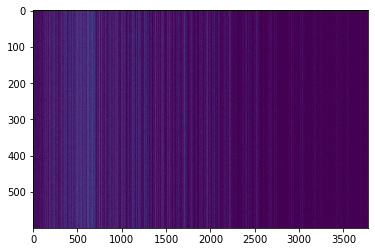

,AUC,pAUC
Source_0,0.526600,0.537895
Source_1,0.577700,0.554737
Source_2,0.604800,0.534211
Target_0,0.480300,0.547368
Target_1,0.655500,0.580000
Target_2,0.533300,0.494211
mean,0.563033,0.541404
h_mean,0.557304,0.540143


2021-05-31 23:36:29,943 - pytorch_modeler.py - INFO - epoch:1/100, train_losses:2532.104909, val_AUC_hmean:0.557304, val_pAUC_hmean:0.540143, best_flag:True
2021-05-31 23:36:29,944 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  9.12it/s]
2021-05-31 23:36:31,262 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 41.03it/s]
2021-05-31 23:36:31,332 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 37.94it/s]


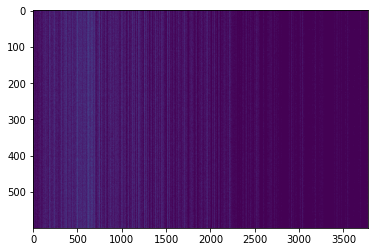

,AUC,pAUC
Source_0,0.551700,0.554737
Source_1,0.591000,0.554737
Source_2,0.672100,0.568421
Target_0,0.529000,0.588947
Target_1,0.662000,0.563158
Target_2,0.637500,0.501579
mean,0.607217,0.555263
h_mean,0.602285,0.553918


2021-05-31 23:36:33,540 - pytorch_modeler.py - INFO - epoch:2/100, train_losses:1568.019765, val_AUC_hmean:0.602285, val_pAUC_hmean:0.553918, best_flag:True
2021-05-31 23:36:33,542 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  9.71it/s]
2021-05-31 23:36:34,780 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 64.35it/s]
2021-05-31 23:36:34,833 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 52.59it/s]
2021-05-31 23:36:34,891 - pytorch_modeler.py - INFO - epoch:3/100, train_losses:1221.652456, val_AUC_hmean:0.602688, val_pAUC_hmean:0.550228, best_flag:False
2021-05-31 23:36:34,892 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  9.40it/s]
2021-05-31 23:36:36,170 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 44.12it/s]
2021-05-31 23:36:36,236 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 46.68it/s]


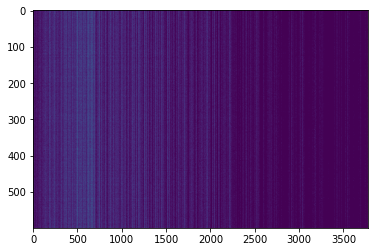

,AUC,pAUC
Source_0,0.559400,0.563158
Source_1,0.633700,0.540000
Source_2,0.721000,0.577895
Target_0,0.541100,0.612105
Target_1,0.682600,0.581579
Target_2,0.663800,0.517895
mean,0.633600,0.565439
h_mean,0.626817,0.563802


2021-05-31 23:36:38,437 - pytorch_modeler.py - INFO - epoch:4/100, train_losses:1079.748718, val_AUC_hmean:0.626817, val_pAUC_hmean:0.563802, best_flag:True
2021-05-31 23:36:38,438 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  9.38it/s]
2021-05-31 23:36:39,718 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 49.87it/s]
2021-05-31 23:36:39,777 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 60.29it/s]
2021-05-31 23:36:39,832 - pytorch_modeler.py - INFO - epoch:5/100, train_losses:1008.521220, val_AUC_hmean:0.633867, val_pAUC_hmean:0.563509, best_flag:False
2021-05-31 23:36:39,833 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  9.88it/s]
2021-05-31 23:36:41,049 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 72.02it/s]
2021-05-31 23:36:41,099 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 43.39it/s]


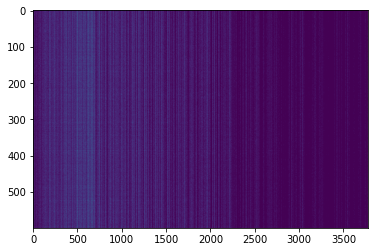

,AUC,pAUC
Source_0,0.576500,0.585789
Source_1,0.676900,0.583684
Source_2,0.793500,0.667368
Target_0,0.544400,0.623158
Target_1,0.695900,0.595263
Target_2,0.645400,0.515263
mean,0.655433,0.595088
h_mean,0.645476,0.591472


2021-05-31 23:36:43,409 - pytorch_modeler.py - INFO - epoch:6/100, train_losses:965.565765, val_AUC_hmean:0.645476, val_pAUC_hmean:0.591472, best_flag:True
2021-05-31 23:36:43,410 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  8.74it/s]
2021-05-31 23:36:44,784 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 50.62it/s]
2021-05-31 23:36:44,842 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 62.08it/s]


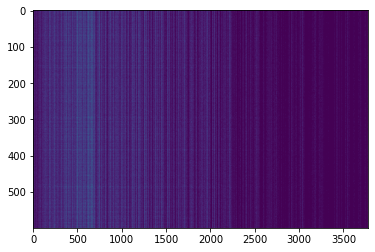

,AUC,pAUC
Source_0,0.573900,0.586316
Source_1,0.702300,0.608947
Source_2,0.803900,0.655263
Target_0,0.550000,0.627895
Target_1,0.696800,0.589474
Target_2,0.608000,0.506316
mean,0.655817,0.595702
h_mean,0.644583,0.591836


2021-05-31 23:36:47,205 - pytorch_modeler.py - INFO - epoch:7/100, train_losses:938.044886, val_AUC_hmean:0.644583, val_pAUC_hmean:0.591836, best_flag:True
2021-05-31 23:36:47,205 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 13.82it/s]
2021-05-31 23:36:48,076 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 66.94it/s]
2021-05-31 23:36:48,130 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 60.00it/s]
2021-05-31 23:36:48,185 - pytorch_modeler.py - INFO - epoch:8/100, train_losses:912.909770, val_AUC_hmean:0.649390, val_pAUC_hmean:0.591736, best_flag:False
2021-05-31 23:36:48,186 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00, 10.14it/s]
2021-05-31 23:36:49,372 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 68.12it/s]
2021-05-31 23:36:49,421 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 80.92it/s]


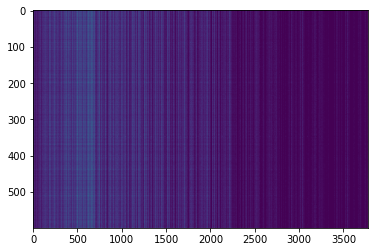

,AUC,pAUC
Source_0,0.602600,0.608421
Source_1,0.734500,0.634211
Source_2,0.811100,0.662632
Target_0,0.555900,0.632105
Target_1,0.703700,0.584737
Target_2,0.613500,0.502632
mean,0.670217,0.604123
h_mean,0.659067,0.599328


2021-05-31 23:36:51,891 - pytorch_modeler.py - INFO - epoch:9/100, train_losses:895.435104, val_AUC_hmean:0.659067, val_pAUC_hmean:0.599328, best_flag:True
2021-05-31 23:36:51,893 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.07it/s]
2021-05-31 23:36:52,642 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 81.83it/s]
2021-05-31 23:36:52,685 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 80.32it/s]
2021-05-31 23:36:52,734 - pytorch_modeler.py - INFO - epoch:10/100, train_losses:876.195379, val_AUC_hmean:0.652460, val_pAUC_hmean:0.593295, best_flag:False
2021-05-31 23:36:52,735 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.11it/s]
2021-05-31 23:36:53,481 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 73.93it/s]
2021-05-31 23:36:53,529 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 58.24it/s]


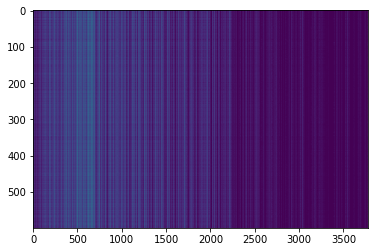

,AUC,pAUC
Source_0,0.610600,0.599474
Source_1,0.736000,0.649474
Source_2,0.815100,0.655263
Target_0,0.567400,0.630526
Target_1,0.714800,0.587368
Target_2,0.627300,0.512105
mean,0.678533,0.605702
h_mean,0.668239,0.601495


2021-05-31 23:36:56,106 - pytorch_modeler.py - INFO - epoch:11/100, train_losses:865.172658, val_AUC_hmean:0.668239, val_pAUC_hmean:0.601495, best_flag:True
2021-05-31 23:36:56,107 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  9.81it/s]
2021-05-31 23:36:57,332 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 76.47it/s]
2021-05-31 23:36:57,381 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 81.95it/s]
2021-05-31 23:36:57,429 - pytorch_modeler.py - INFO - epoch:12/100, train_losses:859.190577, val_AUC_hmean:0.656127, val_pAUC_hmean:0.596687, best_flag:False
2021-05-31 23:36:57,430 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.20it/s]
2021-05-31 23:36:58,173 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 76.97it/s]
2021-05-31 23:36:58,225 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 79.62it/s]


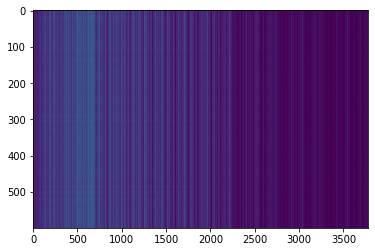

,AUC,pAUC
Source_0,0.649600,0.621053
Source_1,0.721600,0.631579
Source_2,0.800200,0.672105
Target_0,0.577100,0.623684
Target_1,0.712700,0.605789
Target_2,0.632700,0.517368
mean,0.682317,0.611930
h_mean,0.674813,0.608005


2021-05-31 23:37:00,710 - pytorch_modeler.py - INFO - epoch:13/100, train_losses:844.960902, val_AUC_hmean:0.674813, val_pAUC_hmean:0.608005, best_flag:True
2021-05-31 23:37:00,712 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.20it/s]
2021-05-31 23:37:01,454 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.41it/s]
2021-05-31 23:37:01,512 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 56.48it/s]


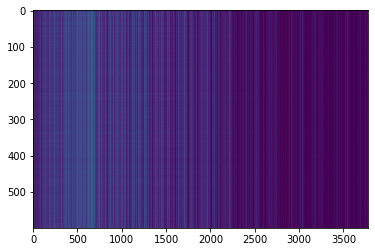

,AUC,pAUC
Source_0,0.627700,0.621053
Source_1,0.717700,0.615789
Source_2,0.802500,0.672105
Target_0,0.578900,0.651053
Target_1,0.715500,0.605263
Target_2,0.647000,0.519474
mean,0.681550,0.614123
h_mean,0.673915,0.610058


2021-05-31 23:37:04,183 - pytorch_modeler.py - INFO - epoch:14/100, train_losses:831.651220, val_AUC_hmean:0.673915, val_pAUC_hmean:0.610058, best_flag:True
2021-05-31 23:37:04,184 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  8.06it/s]
2021-05-31 23:37:05,675 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 45.39it/s]
2021-05-31 23:37:05,737 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 48.79it/s]


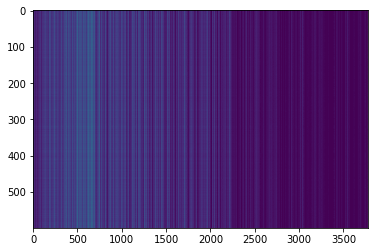

,AUC,pAUC
Source_0,0.656900,0.633684
Source_1,0.743200,0.634737
Source_2,0.826400,0.705263
Target_0,0.594200,0.643684
Target_1,0.742300,0.594737
Target_2,0.666500,0.529474
mean,0.704917,0.623596
h_mean,0.696996,0.618871


2021-05-31 23:37:08,011 - pytorch_modeler.py - INFO - epoch:15/100, train_losses:820.161194, val_AUC_hmean:0.696996, val_pAUC_hmean:0.618871, best_flag:True
2021-05-31 23:37:08,012 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 14.18it/s]
2021-05-31 23:37:08,860 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 80.33it/s]
2021-05-31 23:37:08,905 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 77.53it/s]
2021-05-31 23:37:08,953 - pytorch_modeler.py - INFO - epoch:16/100, train_losses:812.183070, val_AUC_hmean:0.681180, val_pAUC_hmean:0.613196, best_flag:False
2021-05-31 23:37:08,955 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 14.83it/s]
2021-05-31 23:37:09,766 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 77.95it/s]
2021-05-31 23:37:09,814 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 84.86it/s]
2021-05-31 23:37:

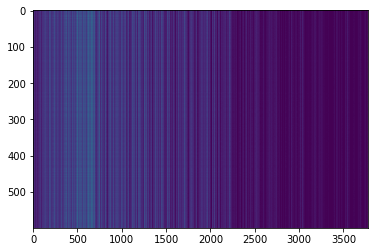

,AUC,pAUC
Source_0,0.653400,0.638947
Source_1,0.748100,0.637895
Source_2,0.830900,0.694737
Target_0,0.588000,0.655263
Target_1,0.737300,0.601579
Target_2,0.658200,0.518947
mean,0.702650,0.624561
h_mean,0.693885,0.619355


2021-05-31 23:37:18,913 - pytorch_modeler.py - INFO - epoch:22/100, train_losses:763.767497, val_AUC_hmean:0.693885, val_pAUC_hmean:0.619355, best_flag:True
2021-05-31 23:37:18,914 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  9.47it/s]
2021-05-31 23:37:20,184 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 50.07it/s]
2021-05-31 23:37:20,243 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 54.82it/s]
2021-05-31 23:37:20,301 - pytorch_modeler.py - INFO - epoch:23/100, train_losses:762.406077, val_AUC_hmean:0.689055, val_pAUC_hmean:0.617486, best_flag:False
2021-05-31 23:37:20,302 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 13.33it/s]
2021-05-31 23:37:21,204 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 63.93it/s]
2021-05-31 23:37:21,259 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 80.45it/s]


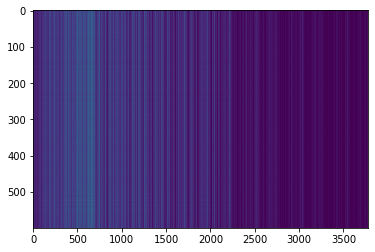

,AUC,pAUC
Source_0,0.666400,0.636316
Source_1,0.754800,0.655789
Source_2,0.807400,0.722105
Target_0,0.590700,0.645263
Target_1,0.759300,0.630526
Target_2,0.655700,0.526842
mean,0.705717,0.636140
h_mean,0.697756,0.630577


2021-05-31 23:37:23,619 - pytorch_modeler.py - INFO - epoch:24/100, train_losses:754.370753, val_AUC_hmean:0.697756, val_pAUC_hmean:0.630577, best_flag:True
2021-05-31 23:37:23,620 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  9.38it/s]
2021-05-31 23:37:24,901 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 39.32it/s]
2021-05-31 23:37:24,975 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 79.11it/s]
2021-05-31 23:37:25,024 - pytorch_modeler.py - INFO - epoch:25/100, train_losses:749.160919, val_AUC_hmean:0.701503, val_pAUC_hmean:0.618732, best_flag:False
2021-05-31 23:37:25,025 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  9.60it/s]
2021-05-31 23:37:26,277 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 54.26it/s]
2021-05-31 23:37:26,332 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 59.01it/s]
2021-05-31 23:37:

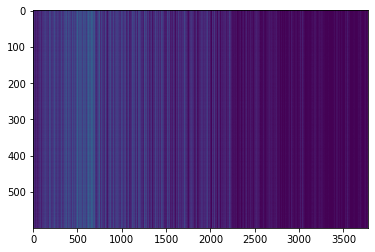

,AUC,pAUC
Source_0,0.706000,0.646316
Source_1,0.762700,0.663158
Source_2,0.822500,0.728421
Target_0,0.617900,0.651053
Target_1,0.771700,0.634211
Target_2,0.685100,0.537895
mean,0.727650,0.643509
h_mean,0.721394,0.638309


2021-05-31 23:37:42,666 - pytorch_modeler.py - INFO - epoch:37/100, train_losses:686.474706, val_AUC_hmean:0.721394, val_pAUC_hmean:0.638309, best_flag:True
2021-05-31 23:37:42,667 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  9.46it/s]
2021-05-31 23:37:43,937 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 48.22it/s]
2021-05-31 23:37:43,996 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 48.93it/s]
2021-05-31 23:37:44,058 - pytorch_modeler.py - INFO - epoch:38/100, train_losses:676.979121, val_AUC_hmean:0.710604, val_pAUC_hmean:0.620638, best_flag:False
2021-05-31 23:37:44,059 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  8.61it/s]
2021-05-31 23:37:45,454 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 39.73it/s]
2021-05-31 23:37:45,525 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 46.58it/s]
2021-05-31 23:37:

100%|██████████| 2/2 [00:00<00:00, 38.00it/s]
2021-05-31 23:38:06,277 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 40.74it/s]
2021-05-31 23:38:06,348 - pytorch_modeler.py - INFO - epoch:54/100, train_losses:604.722015, val_AUC_hmean:0.717413, val_pAUC_hmean:0.619582, best_flag:False
2021-05-31 23:38:06,349 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  9.52it/s]
2021-05-31 23:38:07,611 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 58.42it/s]
2021-05-31 23:38:07,664 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 58.29it/s]
2021-05-31 23:38:07,722 - pytorch_modeler.py - INFO - epoch:55/100, train_losses:600.374914, val_AUC_hmean:0.729596, val_pAUC_hmean:0.629788, best_flag:False
2021-05-31 23:38:07,723 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  9.87it/s]
2021-05-31 23:38:08,941 - pytorch_modeler.py - INFO - valid_source
100%|██████████|

100%|██████████| 12/12 [00:01<00:00,  9.50it/s]
2021-05-31 23:38:30,881 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 62.78it/s]
2021-05-31 23:38:30,941 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 41.10it/s]
2021-05-31 23:38:31,015 - pytorch_modeler.py - INFO - epoch:71/100, train_losses:535.006414, val_AUC_hmean:0.744009, val_pAUC_hmean:0.624590, best_flag:False
2021-05-31 23:38:31,016 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  9.19it/s]
2021-05-31 23:38:32,324 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 37.10it/s]
2021-05-31 23:38:32,400 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 38.56it/s]
2021-05-31 23:38:32,478 - pytorch_modeler.py - INFO - epoch:72/100, train_losses:531.450495, val_AUC_hmean:0.734648, val_pAUC_hmean:0.626993, best_flag:False
2021-05-31 23:38:32,479 - pytorch_modeler.py - INFO - train
100%|██████████|

2021-05-31 23:38:52,362 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  9.77it/s]
2021-05-31 23:38:53,592 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 75.97it/s]
2021-05-31 23:38:53,637 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 81.75it/s]
2021-05-31 23:38:53,685 - pytorch_modeler.py - INFO - epoch:88/100, train_losses:472.709084, val_AUC_hmean:0.737907, val_pAUC_hmean:0.629390, best_flag:False
2021-05-31 23:38:53,686 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 14.69it/s]
2021-05-31 23:38:54,505 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 73.64it/s]
2021-05-31 23:38:54,553 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 78.91it/s]
2021-05-31 23:38:54,605 - pytorch_modeler.py - INFO - epoch:89/100, train_losses:469.275884, val_AUC_hmean:0.737988, val_pAUC_hmean:0.627655, best_flag:False
2021-05-31 23:38

,AUC,pAUC
Source_0,0.706000,0.646316
Source_1,0.762700,0.663158
Source_2,0.822500,0.728421
Target_0,0.617900,0.651053
Target_1,0.771700,0.634211
Target_2,0.685100,0.537895
mean,0.727650,0.643509
h_mean,0.721394,0.638309


2021-05-31 23:39:06,982 - 00_train.py - INFO - TARGET MACHINE_TYPE: slider
2021-05-31 23:39:06,983 - 00_train.py - INFO - MAKE DATA_LOADER
2021-05-31 23:39:06,985 - 00_train.py - INFO - TRAINING


elapsed time: 160.934103251 [sec]


2021-05-31 23:39:07,529 - pytorch_modeler.py - INFO - train
 17%|█▋        | 2/12 [00:00<00:00, 14.77it/s]

use: cuda:0


100%|██████████| 12/12 [00:00<00:00, 14.39it/s]
2021-05-31 23:39:08,365 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 51.20it/s]
2021-05-31 23:39:08,424 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 47.53it/s]


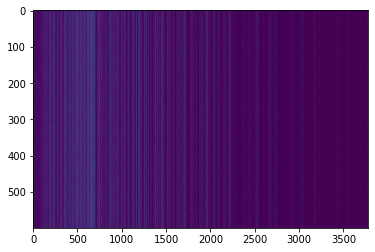

,AUC,pAUC
Source_0,0.523300,0.533684
Source_1,0.581400,0.543158
Source_2,0.643200,0.528421
Target_0,0.489800,0.551579
Target_1,0.684000,0.581053
Target_2,0.545300,0.482632
mean,0.577833,0.536754
h_mean,0.570171,0.535081


2021-05-31 23:39:10,693 - pytorch_modeler.py - INFO - epoch:1/100, train_losses:2494.259389, val_AUC_hmean:0.570171, val_pAUC_hmean:0.535081, best_flag:True
2021-05-31 23:39:10,693 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.06it/s]
2021-05-31 23:39:11,692 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 62.92it/s]
2021-05-31 23:39:11,747 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 82.53it/s]


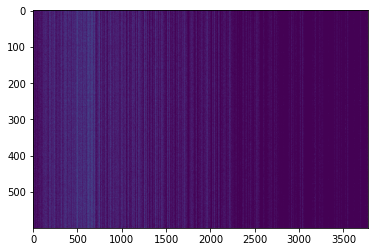

,AUC,pAUC
Source_0,0.547800,0.551579
Source_1,0.588700,0.539474
Source_2,0.671200,0.584737
Target_0,0.539100,0.584211
Target_1,0.664000,0.576842
Target_2,0.628800,0.497895
mean,0.606600,0.555789
h_mean,0.602089,0.553988


2021-05-31 23:39:14,214 - pytorch_modeler.py - INFO - epoch:2/100, train_losses:1530.401388, val_AUC_hmean:0.602089, val_pAUC_hmean:0.553988, best_flag:True
2021-05-31 23:39:14,215 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  9.45it/s]
2021-05-31 23:39:15,487 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 39.16it/s]
2021-05-31 23:39:15,557 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 40.18it/s]


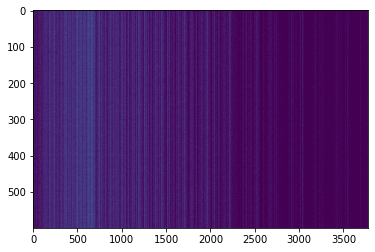

,AUC,pAUC
Source_0,0.555900,0.552632
Source_1,0.613400,0.556842
Source_2,0.694800,0.588421
Target_0,0.540300,0.600526
Target_1,0.675900,0.584211
Target_2,0.643100,0.518947
mean,0.620567,0.566930
h_mean,0.615151,0.565572


2021-05-31 23:39:17,793 - pytorch_modeler.py - INFO - epoch:3/100, train_losses:1192.317505, val_AUC_hmean:0.615151, val_pAUC_hmean:0.565572, best_flag:True
2021-05-31 23:39:17,794 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  9.05it/s]
2021-05-31 23:39:19,122 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 49.33it/s]
2021-05-31 23:39:19,186 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 47.76it/s]


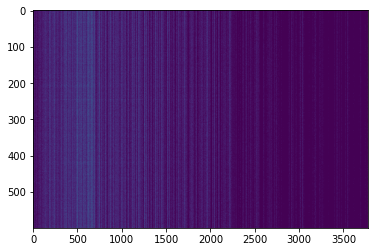

,AUC,pAUC
Source_0,0.563000,0.546842
Source_1,0.647400,0.576842
Source_2,0.742900,0.584737
Target_0,0.553400,0.605263
Target_1,0.667400,0.577368
Target_2,0.662900,0.515789
mean,0.639500,0.567807
h_mean,0.632858,0.566285


2021-05-31 23:39:21,582 - pytorch_modeler.py - INFO - epoch:4/100, train_losses:1048.117742, val_AUC_hmean:0.632858, val_pAUC_hmean:0.566285, best_flag:True
2021-05-31 23:39:21,583 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  9.15it/s]
2021-05-31 23:39:22,897 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 45.99it/s]
2021-05-31 23:39:22,959 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 40.69it/s]


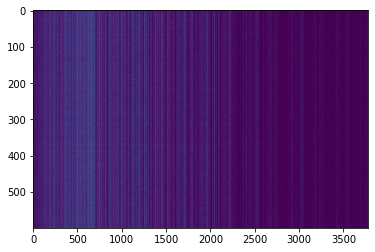

,AUC,pAUC
Source_0,0.562000,0.571579
Source_1,0.641600,0.541053
Source_2,0.782300,0.604211
Target_0,0.531100,0.610000
Target_1,0.678400,0.586316
Target_2,0.671200,0.510526
mean,0.644433,0.570614
h_mean,0.634045,0.568369


2021-05-31 23:39:25,486 - pytorch_modeler.py - INFO - epoch:5/100, train_losses:978.778798, val_AUC_hmean:0.634045, val_pAUC_hmean:0.568369, best_flag:True
2021-05-31 23:39:25,487 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  9.11it/s]
2021-05-31 23:39:26,807 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.43it/s]
2021-05-31 23:39:26,862 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 54.59it/s]


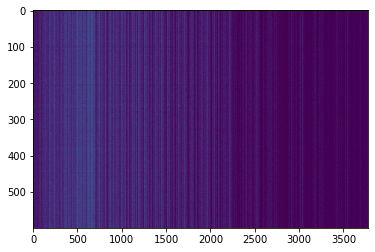

,AUC,pAUC
Source_0,0.581600,0.575789
Source_1,0.666600,0.562632
Source_2,0.791800,0.638947
Target_0,0.545600,0.616842
Target_1,0.683900,0.583158
Target_2,0.637400,0.503684
mean,0.651150,0.580175
h_mean,0.641958,0.576895


2021-05-31 23:39:28,988 - pytorch_modeler.py - INFO - epoch:6/100, train_losses:937.226186, val_AUC_hmean:0.641958, val_pAUC_hmean:0.576895, best_flag:True
2021-05-31 23:39:28,989 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  9.39it/s]
2021-05-31 23:39:30,268 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 49.49it/s]
2021-05-31 23:39:30,327 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 55.62it/s]


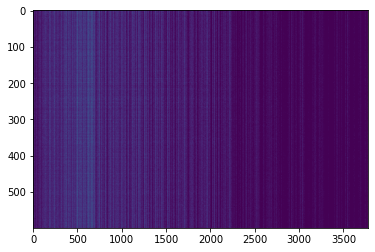

,AUC,pAUC
Source_0,0.576900,0.586842
Source_1,0.666800,0.558421
Source_2,0.786300,0.618421
Target_0,0.539400,0.625263
Target_1,0.686100,0.601053
Target_2,0.626700,0.511053
mean,0.647033,0.583509
h_mean,0.637486,0.580740


2021-05-31 23:39:32,946 - pytorch_modeler.py - INFO - epoch:7/100, train_losses:906.185460, val_AUC_hmean:0.637486, val_pAUC_hmean:0.580740, best_flag:True
2021-05-31 23:39:32,947 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00, 10.02it/s]
2021-05-31 23:39:34,146 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 59.63it/s]
2021-05-31 23:39:34,202 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 58.84it/s]


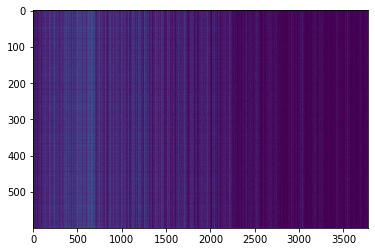

,AUC,pAUC
Source_0,0.599700,0.593684
Source_1,0.696300,0.591579
Source_2,0.815700,0.681053
Target_0,0.563100,0.630000
Target_1,0.707000,0.594737
Target_2,0.639100,0.511579
mean,0.670150,0.600439
h_mean,0.660457,0.596033


2021-05-31 23:39:36,506 - pytorch_modeler.py - INFO - epoch:8/100, train_losses:882.351110, val_AUC_hmean:0.660457, val_pAUC_hmean:0.596033, best_flag:True
2021-05-31 23:39:36,507 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  9.39it/s]
2021-05-31 23:39:37,788 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 47.17it/s]
2021-05-31 23:39:37,853 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 47.41it/s]
2021-05-31 23:39:37,919 - pytorch_modeler.py - INFO - epoch:9/100, train_losses:866.308482, val_AUC_hmean:0.657153, val_pAUC_hmean:0.586687, best_flag:False
2021-05-31 23:39:37,920 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  9.46it/s]
2021-05-31 23:39:39,190 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 52.63it/s]
2021-05-31 23:39:39,247 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 51.72it/s]
2021-05-31 23:39:39

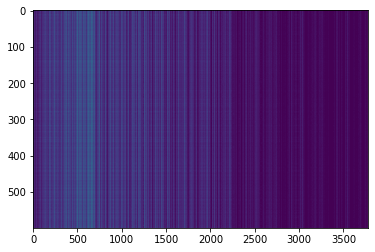

,AUC,pAUC
Source_0,0.639300,0.613158
Source_1,0.679500,0.582105
Source_2,0.813700,0.688421
Target_0,0.587900,0.641579
Target_1,0.705300,0.589474
Target_2,0.601500,0.512105
mean,0.671200,0.604474
h_mean,0.663265,0.599448


2021-05-31 23:39:42,975 - pytorch_modeler.py - INFO - epoch:11/100, train_losses:839.711136, val_AUC_hmean:0.663265, val_pAUC_hmean:0.599448, best_flag:True
2021-05-31 23:39:42,976 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  9.45it/s]
2021-05-31 23:39:44,248 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 38.83it/s]
2021-05-31 23:39:44,320 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 48.47it/s]


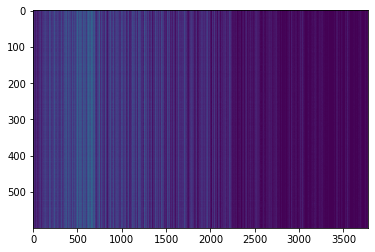

,AUC,pAUC
Source_0,0.662100,0.604737
Source_1,0.709400,0.591579
Source_2,0.830200,0.709474
Target_0,0.595300,0.635263
Target_1,0.710800,0.589474
Target_2,0.646900,0.517895
mean,0.692450,0.608070
h_mean,0.685163,0.602714


2021-05-31 23:39:46,632 - pytorch_modeler.py - INFO - epoch:12/100, train_losses:822.562907, val_AUC_hmean:0.685163, val_pAUC_hmean:0.602714, best_flag:True
2021-05-31 23:39:46,633 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  9.42it/s]
2021-05-31 23:39:47,908 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 63.16it/s]
2021-05-31 23:39:47,962 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 59.32it/s]


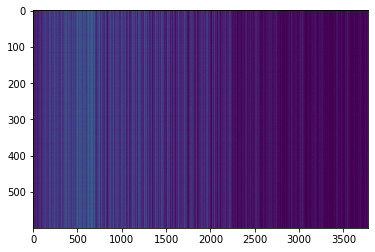

,AUC,pAUC
Source_0,0.645600,0.608947
Source_1,0.716600,0.614211
Source_2,0.818300,0.693684
Target_0,0.589500,0.640000
Target_1,0.727100,0.600000
Target_2,0.643500,0.520526
mean,0.690100,0.612895
h_mean,0.682427,0.608386


2021-05-31 23:40:00,864 - pytorch_modeler.py - INFO - epoch:13/100, train_losses:813.017324, val_AUC_hmean:0.682427, val_pAUC_hmean:0.608386, best_flag:True
2021-05-31 23:40:00,865 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  9.53it/s]
2021-05-31 23:40:02,130 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 11.06it/s]
2021-05-31 23:40:02,337 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 51.22it/s]
2021-05-31 23:40:02,409 - pytorch_modeler.py - INFO - epoch:14/100, train_losses:805.308777, val_AUC_hmean:0.668955, val_pAUC_hmean:0.592278, best_flag:False
2021-05-31 23:40:02,410 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  9.45it/s]
2021-05-31 23:40:03,682 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 46.15it/s]
2021-05-31 23:40:03,747 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 48.46it/s]


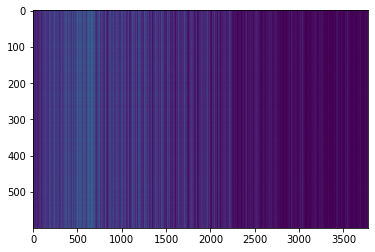

,AUC,pAUC
Source_0,0.655300,0.616842
Source_1,0.729000,0.620526
Source_2,0.803100,0.710526
Target_0,0.596200,0.644737
Target_1,0.758800,0.612105
Target_2,0.652300,0.519474
mean,0.699117,0.620702
h_mean,0.691951,0.615394


2021-05-31 23:40:05,860 - pytorch_modeler.py - INFO - epoch:15/100, train_losses:793.975540, val_AUC_hmean:0.691951, val_pAUC_hmean:0.615394, best_flag:True
2021-05-31 23:40:05,861 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  9.50it/s]
2021-05-31 23:40:07,126 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 48.16it/s]
2021-05-31 23:40:07,186 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 39.45it/s]
2021-05-31 23:40:07,258 - pytorch_modeler.py - INFO - epoch:16/100, train_losses:786.931005, val_AUC_hmean:0.675732, val_pAUC_hmean:0.604312, best_flag:False
2021-05-31 23:40:07,259 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  9.50it/s]
2021-05-31 23:40:08,523 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 49.30it/s]
2021-05-31 23:40:08,583 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 50.59it/s]


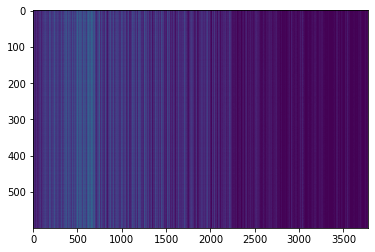

,AUC,pAUC
Source_0,0.638200,0.610526
Source_1,0.739000,0.661053
Source_2,0.810100,0.709474
Target_0,0.584300,0.646316
Target_1,0.764800,0.621053
Target_2,0.669500,0.521053
mean,0.700983,0.628246
h_mean,0.692270,0.622616


2021-05-31 23:40:10,703 - pytorch_modeler.py - INFO - epoch:17/100, train_losses:777.920705, val_AUC_hmean:0.692270, val_pAUC_hmean:0.622616, best_flag:True
2021-05-31 23:40:10,704 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  9.24it/s]
2021-05-31 23:40:12,005 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 46.01it/s]
2021-05-31 23:40:12,071 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 48.43it/s]
2021-05-31 23:40:12,135 - pytorch_modeler.py - INFO - epoch:18/100, train_losses:770.996953, val_AUC_hmean:0.696042, val_pAUC_hmean:0.616607, best_flag:False
2021-05-31 23:40:12,136 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00, 11.00it/s]
2021-05-31 23:40:13,228 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 80.89it/s]
2021-05-31 23:40:13,271 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 81.87it/s]
2021-05-31 23:40:

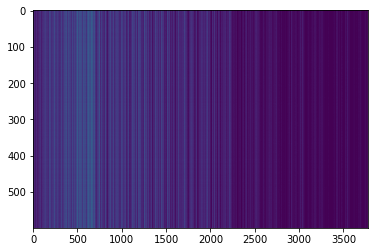

,AUC,pAUC
Source_0,0.675000,0.634737
Source_1,0.740900,0.644737
Source_2,0.808200,0.721579
Target_0,0.602900,0.657368
Target_1,0.786900,0.640526
Target_2,0.688100,0.531579
mean,0.717000,0.638421
h_mean,0.709955,0.633182


2021-05-31 23:40:25,949 - pytorch_modeler.py - INFO - epoch:27/100, train_losses:711.265523, val_AUC_hmean:0.709955, val_pAUC_hmean:0.633182, best_flag:True
2021-05-31 23:40:25,949 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  9.10it/s]
2021-05-31 23:40:27,270 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 46.46it/s]
2021-05-31 23:40:27,331 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 62.23it/s]
2021-05-31 23:40:27,386 - pytorch_modeler.py - INFO - epoch:28/100, train_losses:710.007401, val_AUC_hmean:0.712817, val_pAUC_hmean:0.631333, best_flag:False
2021-05-31 23:40:27,387 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  9.39it/s]
2021-05-31 23:40:28,666 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 40.83it/s]
2021-05-31 23:40:28,739 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 73.53it/s]
2021-05-31 23:40:

100%|██████████| 2/2 [00:00<00:00, 40.52it/s]
2021-05-31 23:40:50,029 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 42.95it/s]
2021-05-31 23:40:50,097 - pytorch_modeler.py - INFO - epoch:44/100, train_losses:625.127421, val_AUC_hmean:0.717201, val_pAUC_hmean:0.626670, best_flag:False
2021-05-31 23:40:50,098 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 15.22it/s]
2021-05-31 23:40:50,888 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 78.46it/s]
2021-05-31 23:40:50,932 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 79.80it/s]
2021-05-31 23:40:50,979 - pytorch_modeler.py - INFO - epoch:45/100, train_losses:621.026306, val_AUC_hmean:0.718318, val_pAUC_hmean:0.624983, best_flag:False
2021-05-31 23:40:50,980 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 15.83it/s]
2021-05-31 23:40:51,740 - pytorch_modeler.py - INFO - valid_source
100%|██████████|

100%|██████████| 12/12 [00:01<00:00, 10.05it/s]
2021-05-31 23:41:10,178 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 46.97it/s]
2021-05-31 23:41:10,240 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 65.41it/s]
2021-05-31 23:41:10,295 - pytorch_modeler.py - INFO - epoch:61/100, train_losses:556.442149, val_AUC_hmean:0.718889, val_pAUC_hmean:0.623469, best_flag:False
2021-05-31 23:41:10,297 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.02it/s]
2021-05-31 23:41:11,047 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 80.92it/s]
2021-05-31 23:41:11,091 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 75.37it/s]
2021-05-31 23:41:11,142 - pytorch_modeler.py - INFO - epoch:62/100, train_losses:551.622426, val_AUC_hmean:0.720122, val_pAUC_hmean:0.627969, best_flag:False
2021-05-31 23:41:11,143 - pytorch_modeler.py - INFO - train
100%|██████████|

2021-05-31 23:41:28,723 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.17it/s]
2021-05-31 23:41:29,468 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 79.06it/s]
2021-05-31 23:41:29,512 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 80.60it/s]
2021-05-31 23:41:29,560 - pytorch_modeler.py - INFO - epoch:78/100, train_losses:488.714327, val_AUC_hmean:0.731704, val_pAUC_hmean:0.627723, best_flag:False
2021-05-31 23:41:29,561 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 15.03it/s]
2021-05-31 23:41:30,361 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 47.95it/s]
2021-05-31 23:41:30,421 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 51.52it/s]
2021-05-31 23:41:30,482 - pytorch_modeler.py - INFO - epoch:79/100, train_losses:487.757782, val_AUC_hmean:0.732128, val_pAUC_hmean:0.626143, best_flag:False
2021-05-31 23:41

100%|██████████| 2/2 [00:00<00:00, 77.19it/s]
2021-05-31 23:41:50,599 - pytorch_modeler.py - INFO - epoch:94/100, train_losses:434.334628, val_AUC_hmean:0.720303, val_pAUC_hmean:0.621188, best_flag:False
2021-05-31 23:41:50,602 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00,  9.58it/s]
2021-05-31 23:41:51,856 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 60.38it/s]
2021-05-31 23:41:51,908 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 54.93it/s]
2021-05-31 23:41:51,967 - pytorch_modeler.py - INFO - epoch:95/100, train_losses:429.241302, val_AUC_hmean:0.724508, val_pAUC_hmean:0.617503, best_flag:False
2021-05-31 23:41:51,968 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00, 10.92it/s]
2021-05-31 23:41:53,070 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 80.32it/s]
2021-05-31 23:41:53,118 - pytorch_modeler.py - INFO - valid_target
100%|██████████|

,AUC,pAUC
Source_0,0.675000,0.634737
Source_1,0.740900,0.644737
Source_2,0.808200,0.721579
Target_0,0.602900,0.657368
Target_1,0.786900,0.640526
Target_2,0.688100,0.531579
mean,0.717000,0.638421
h_mean,0.709955,0.633182


elapsed time: 170.887103081 [sec]


In [15]:
for machine_type in machine_types:
    run(machine_type)

In [16]:
#run(machine_types[2])